# Import modules

In [1]:
%%time

import datetime
import os, glob, sys
import warnings
warnings.filterwarnings('ignore', '.*invalid value encountered in true_divide.*', )

import pickle

import numpy as np
import xarray as xr
import matplotlib as mpl
import matplotlib.pyplot as plt
import cartopy.crs       as ccrs
import cartopy

from scipy.interpolate import UnivariateSpline
from sklearn.metrics import r2_score, mean_squared_error, explained_variance_score
from scipy.stats import pearsonr, spearmanr

mpl.rcParams['savefig.dpi'] = 300

CPU times: user 1.51 s, sys: 2.43 s, total: 3.94 s
Wall time: 2.94 s


# Starters

In [2]:
%%time
print(datetime.datetime.now())

dirout = 'dimred-220411/'
if not os.path.isdir(dirout) : os.mkdir(dirout)

2023-12-13 16:50:26.718668
CPU times: user 244 µs, sys: 0 ns, total: 244 µs
Wall time: 211 µs


In [3]:
%%time
print(datetime.datetime.now())
sys.stdout.echo = open(dirout+'stdout.txt', 'w')
sys.stderr.echo = open(dirout+'stderr.txt', 'w')

2023-12-13 16:50:27.156216
CPU times: user 687 µs, sys: 591 µs, total: 1.28 ms
Wall time: 82.6 ms


# Input parameters

In [4]:
%%time
print(datetime.datetime.now())

dirshared = '/mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/'


2023-12-13 16:50:28.312502
CPU times: user 24 µs, sys: 31 µs, total: 55 µs
Wall time: 54.8 µs


# Define functions

In [5]:
def p_smooth_spline(t,x):
    spline = UnivariateSpline(t, x, k=3, bbox=[np.min(t), np.max(t)])
    y = spline(t)
    return(y)
#

def dtrd_dseas(zwraw, zwtrd): 
    zwdtrd = zwraw - zwtrd
    zw = []
    for mmm in np.arange(12): zw.append(np.nanmean(zwdtrd[mmm::12]))
    zwseas = []
    for yyy in np.arange(len(zwraw)/12): zwseas.extend(zw)
    zwseas = np.array(zwseas)
    return zwraw - zwtrd - zwseas, zwseas+zwtrd, zwseas
#



# Load and prepare data

## Inputs

In [6]:
dirin = '/mnt/reef-ns1002k/daco/DATA_FROM_KLAUS/COMPUTE10-RESULTS/'
model_list = ['NorESM2-LM', 'MPI-ESM1-2-LR', 'CNRM-ESM2-1', 'CESM2', 'ACCESS-ESM1-5', 'IPSL-CM6A-LR']
simu_list  = ['picontrol', 'historical', 'ssp126', 'ssp585']
#grid_list  = ['90x45', '180x90']
grid_list  = ['360x180']

## Load, rearange datas and save to pickle

In [7]:
%%time
print(datetime.datetime.now())
print('Load, rearange datas and save to pickle')

for model in model_list: 
    
    print("> model:"+model)
    
    for simu in simu_list:

        print(">> simu:"+simu)
        
        for grid in grid_list: 
            
            print(">>> grid: "+grid)
            
            #------------------
            # LOAD DATA
            #------------------

            print(">>>> Load data")
            
            fname = dirin + 'results_' + model + '-' + simu + '-' + grid + '/' + \
                model + '-' + simu + '-' + grid + '.npy'
            results = np.load(fname, allow_pickle=True)
            print('Loaded: '+fname)

            first_valid_entry = -1
            for k in range(results.shape[0]):
                if results[k, 4][2] is not None:
                    first_valid_entry = k
                    break
            assert(first_valid_entry >= 0)

            #------------------
            # DEFINE LAT, LON, MON
            #------------------

            print(">>>> Define lat, lon, mon")

            n_lon = results[first_valid_entry,0]
            n_lat = results[first_valid_entry,1]
            n_mon = results[first_valid_entry,4][2][:,0].shape[0]
            hx = 360 / n_lon
            hy = 180 / n_lat

            mid_points = np.zeros((results.shape[0], 2))
            lon = np.zeros((results.shape[0]))
            lat = np.zeros((results.shape[0]))  

            for k_entry in range(results.shape[0]): # loop on grid point            
                zwlon = results[k_entry, 2]
                zwlat = results[k_entry, 3]
                mid_points[k_entry, 0] = (0.5 + zwlon) * hx - 180
                mid_points[k_entry, 1] = (0.5 + zwlat) * hy - 90
                lon[k_entry] = zwlon * hx - 180
                lat[k_entry] = zwlat * hy - 90            
            #

            # reshape datas
            lon    = np.reshape(lon, (n_lon, n_lat))
            lat    = np.reshape(lat, (n_lon, n_lat))

            #------------------
            # SCORE AND TRUE AND PREDICTED SIGNAL
            #------------------

            print(">>>> True and predicted signal and score")
            
            totscor_avg = np.zeros((results.shape[0]))
            totscor_std = np.zeros((results.shape[0]))
            cfxtrue = np.zeros((results.shape[0], n_mon))
            cfxpred = np.zeros((results.shape[0], n_mon))
            cfxstd  = np.zeros((results.shape[0], n_mon))

            for k_entry in range(results.shape[0]): # loop on grid point

                #__________________
                # TRUE AND PRED SIGNALS
                if results[k_entry, 4][2] is not None:
                    cfxtrue[k_entry] = results[k_entry, 4][2][:, 0].data
                    cfxpred[k_entry] = results[k_entry, 4][2][:, 1].data
                    cfxstd [k_entry] = results[k_entry, 4][2][:, 2].data
                else:
                    cfxtrue[k_entry] = np.float('nan')*cfxtrue[k_entry]
                    cfxpred[k_entry] = np.float('nan')*cfxpred[k_entry]
                    cfxstd [k_entry] = np.float('nan')*cfxstd [k_entry]
                #

                #__________________
                # SCORE
                if results[k_entry, 4][1] is not None:
                    totscor_avg[k_entry] = results[k_entry, 4][1][0]['total score avg']
                    totscor_std[k_entry] = results[k_entry, 4][1][0]['total score std']
                else:
                    totscor_avg[k_entry] = np.float('nan')
                    totscor_std[k_entry] = np.float('nan')
                #
            #                  

            # reshape datas
            cfxtrue = np.reshape(cfxtrue, (n_lon, n_lat, n_mon))    
            cfxpred = np.reshape(cfxpred, (n_lon, n_lat, n_mon))    
            cfxstd  = np.reshape(cfxstd, (n_lon, n_lat, n_mon))    
            totscor_avg = np.reshape(totscor_avg, (n_lon, n_lat))    
            totscor_std = np.reshape(totscor_std, (n_lon, n_lat))    

            # save
            data2save = {}
            data2save['lon'] = lon
            data2save['lat'] = lat
            data2save['cfxtrue'] = cfxtrue
            data2save['cfxpred'] = cfxpred
            data2save['cfxstd']  = cfxstd

            savedfile = dirout + 'cfx-true-pred-std-' + model+'-'+simu+'-'+grid+'.pckl'
            if os.path.isfile(savedfile): os.remove(savedfile)
            with open(savedfile, 'wb') as f1:pickle.dump(data2save, f1)
            print("File saved: "+savedfile)        

            data2save = {}
            data2save['lon'] = lon
            data2save['lat'] = lat
            data2save['totscor_avg'] = totscor_avg
            data2save['totscor_std'] = totscor_std

            savedfile = dirout + 'score-std-' + model+'-'+simu+'-'+grid+'.pckl'
            if os.path.isfile(savedfile): os.remove(savedfile)
            with open(savedfile, 'wb') as f1:pickle.dump(data2save, f1)
            print("File saved: "+savedfile)        


            #------------------
            # FEATURE IMPORTANCES
            #------------------

            print(">>>> Feature importances")
            
            feature_names = results[first_valid_entry, 4][1][0]['fi'][0]
            n_features = len(feature_names)

            data2save = {}
            data2save['lon'] = lon
            data2save['lat'] = lat

            for k_fi, name_fi in enumerate(feature_names): # loop on features

                fi_avg = np.zeros(results.shape[0])
                fi_std = np.zeros(results.shape[0])

                for k_entry in range(results.shape[0]): # loop on grid points
                    if results[k_entry, 4][1] is not None:
                        zw1 = results[k_entry, 4][1][0]['fi'][1]
                        zw1 = zw1 / np.sum(zw1) # normalization
                        fi_avg[k_entry] = zw1[k_fi]
                        zw1 = results[k_entry,4][1][0]['fi'][2] / results[k_entry,4][1][0]['fi'][1] * 100
                        fi_std[k_entry] = zw1[k_fi]
                    else:
                        fi_avg[k_entry] = np.float('nan')
                        fi_std[k_entry] = np.float('nan')
                    #
                #

                # reshape datas
                fi_avg = np.reshape(fi_avg, (n_lon, n_lat))    
                fi_std = np.reshape(fi_std, (n_lon, n_lat))    
                # make nan data
                fi_avg[fi_avg<0] = np.float('nan')
                fi_std[fi_avg<0] = np.float('nan')

                data2save[name_fi] = {}
                data2save[name_fi]['avg'] = fi_avg
                data2save[name_fi]['std'] = fi_std
            #

            savedfile = dirout + 'fi-std-' + model+'-'+simu+'-'+grid+'.pckl'
            if os.path.isfile(savedfile): os.remove(savedfile)
            with open(savedfile, 'wb') as f1:pickle.dump(data2save, f1)
            print("File saved: "+savedfile)        
        #    
    #
#

# ca. 7m for grid 360x180

2022-05-05 15:09:51.734503
Load, rearange datas and save to pickle
> model:NorESM2-LM
>> simu:picontrol
>>> grid: 360x180
>>>> Load data
Loaded: /mnt/reef-ns1002k/daco/DATA_FROM_KLAUS/COMPUTE10-RESULTS/results_NorESM2-LM-picontrol-360x180/NorESM2-LM-picontrol-360x180.npy
>>>> Define lat, lon, mon
>>>> True and predicted signal and score
File saved: dimred-220411/cfx-true-pred-std-NorESM2-LM-picontrol-360x180.pckl
File saved: dimred-220411/score-std-NorESM2-LM-picontrol-360x180.pckl
>>>> Feature importances


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:155: RuntimeWarning: divide by zero encountered in true_divide
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:167: RuntimeWarning: invalid value encountered in less
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:168: RuntimeWarning: invalid value encountered in less


File saved: dimred-220411/fi-std-NorESM2-LM-picontrol-360x180.pckl
>> simu:historical
>>> grid: 360x180
>>>> Load data
Loaded: /mnt/reef-ns1002k/daco/DATA_FROM_KLAUS/COMPUTE10-RESULTS/results_NorESM2-LM-historical-360x180/NorESM2-LM-historical-360x180.npy
>>>> Define lat, lon, mon
>>>> True and predicted signal and score
File saved: dimred-220411/cfx-true-pred-std-NorESM2-LM-historical-360x180.pckl
File saved: dimred-220411/score-std-NorESM2-LM-historical-360x180.pckl
>>>> Feature importances
File saved: dimred-220411/fi-std-NorESM2-LM-historical-360x180.pckl
>> simu:ssp126
>>> grid: 360x180
>>>> Load data
Loaded: /mnt/reef-ns1002k/daco/DATA_FROM_KLAUS/COMPUTE10-RESULTS/results_NorESM2-LM-ssp126-360x180/NorESM2-LM-ssp126-360x180.npy
>>>> Define lat, lon, mon
>>>> True and predicted signal and score
File saved: dimred-220411/cfx-true-pred-std-NorESM2-LM-ssp126-360x180.pckl
File saved: dimred-220411/score-std-NorESM2-LM-ssp126-360x180.pckl
>>>> Feature importances
File saved: dimred-2204

## Order features form more to less important and save as pickle

In [8]:
%%time
print(datetime.datetime.now())
print('Ordering features, save as a pckl')

for model in model_list: 

    print("> "+model)
    
    for simu in simu_list: 

        print(">> "+simu)

        for grid in grid_list: 
            
            print(">> grid: "+grid)
            
            savedfile = dirout + 'fi-std-' + model+'-'+simu+'-'+grid+'.pckl'
            with open(savedfile, 'rb') as f1: feature_importance = pickle.load(f1)
            print("File loaded: "+savedfile)

            #---------------------
            # attribute a value for each feature
            #---------------------

            feature_names = list(feature_importance.keys())
            feature_names.remove('lon')
            feature_names.remove('lat')
            n_features = len(feature_names)
            icnt = 0
            feature_names_idx = {}
            for kk in feature_names : 
                feature_names_idx[kk]=icnt
                icnt+=1
            #

            #---------------------
            # create dictionnary with key for feature 1, feature2.. from more to less important
            #---------------------

            ordered_features = {'lat':feature_importance['lat'], 'lon':feature_importance['lon'], 'feature_names_idx':feature_names_idx, 'features':{}}
            for kkk in np.arange(n_features) : 
                ordered_features['features']['feature '+str(kkk)] = {'fname':np.zeros_like(feature_importance[feature_names[0]]['avg']), 
                                                                     'fi'   :np.zeros_like(feature_importance[feature_names[0]]['avg'])}
            #
            ordered_features_names = list(ordered_features.keys())
            ordered_features_names.remove('lon')
            ordered_features_names.remove('lat')
            ordered_features_names.remove('feature_names_idx')

            #---------------------
            # Sort features 
            #---------------------

            for jj in range(feature_importance[feature_names[0]]['avg'].shape[0]) : 
                for ii in range(feature_importance[feature_names[0]]['avg'].shape[1]) : 
                    zwfi = []
                    if not np.isnan(feature_importance[feature_names[0]]['avg'][jj, ii]) : 
                        for fname in feature_names : zwfi.append(feature_importance[fname]['avg'][jj, ii])
                        inan = list(np.where(np.isnan(zwfi))[0])
                        zwfi = np.where(np.isnan(zwfi), 0., zwfi)
                        zwfname_ordered = [x for _, x in sorted(zip(zwfi, feature_names))]
                        zwfi_ordered = [x for x, _ in sorted(zip(zwfi, feature_names))]
                        zwfname_ordered.reverse()
                        zwfi_ordered.reverse()
                        for ind, (fname, fi) in enumerate(zip(zwfname_ordered, zwfi_ordered)):
                            ordered_features['features']['feature '+str(ind)]['fname'][jj, ii] = feature_names_idx[fname]
                            ordered_features['features']['feature '+str(ind)]['fi'][jj, ii]    = fi
                        #
                    else : 
                        for kkk in ordered_features['features'].keys() : 
                            ordered_features['features'][kkk]['fname'][jj, ii] = np.float('nan')
                            ordered_features['features'][kkk]['fi'][jj, ii] = np.float('nan')
                        #
                    #
                #
            #

            #---------------------
            # Save
            #---------------------

            savedfile = dirout + 'ordered-fi-std-' + model+'-'+simu+'-'+grid+'.pckl'
            if os.path.isfile(savedfile): os.remove(savedfile)
            with open(savedfile, 'wb') as f1:pickle.dump(ordered_features, f1)
            print("File saved: "+savedfile)      
        #
    #
#

# ca. 1m grid 360x180

2022-05-05 15:19:46.930755
Ordering features, save as a pckl
> NorESM2-LM
>> picontrol
>> grid: 360x180
File loaded: dimred-220411/fi-std-NorESM2-LM-picontrol-360x180.pckl
File saved: dimred-220411/ordered-fi-std-NorESM2-LM-picontrol-360x180.pckl
>> historical
>> grid: 360x180
File loaded: dimred-220411/fi-std-NorESM2-LM-historical-360x180.pckl
File saved: dimred-220411/ordered-fi-std-NorESM2-LM-historical-360x180.pckl
>> ssp126
>> grid: 360x180
File loaded: dimred-220411/fi-std-NorESM2-LM-ssp126-360x180.pckl
File saved: dimred-220411/ordered-fi-std-NorESM2-LM-ssp126-360x180.pckl
>> ssp585
>> grid: 360x180
File loaded: dimred-220411/fi-std-NorESM2-LM-ssp585-360x180.pckl
File saved: dimred-220411/ordered-fi-std-NorESM2-LM-ssp585-360x180.pckl
> MPI-ESM1-2-LR
>> picontrol
>> grid: 360x180
File loaded: dimred-220411/fi-std-MPI-ESM1-2-LR-picontrol-360x180.pckl
File saved: dimred-220411/ordered-fi-std-MPI-ESM1-2-LR-picontrol-360x180.pckl
>> historical
>> grid: 360x180
File loaded: dimred-220

# Score analysis

## Inputs

In [9]:
%%time
print(datetime.datetime.now())
print('Score analysis: inputs')

model_list = ['NorESM2-LM', 'MPI-ESM1-2-LR', 'CNRM-ESM2-1', 'CESM2', 'ACCESS-ESM1-5', 'IPSL-CM6A-LR']
simu_list  = ['picontrol', 'historical', 'ssp126', 'ssp585']
#grid_list  = ['90x45', '180x90']
grid  = '360x180'

# Create and add a Rectangle patch

if   grid == '90x45'   : gridpt_list = [(1*8, 1*15), (1*30, 1*85)]
elif grid == '180x90'  : gridpt_list = [(2*8, 2*15), (2*30, 2*85)]
elif grid == '360x180' : gridpt_list = [(4*8, 4*15), (4*30, 4*85)]

2023-12-13 16:52:44.441377
Score analysis: inputs
CPU times: user 132 µs, sys: 91 µs, total: 223 µs
Wall time: 223 µs


## maps score Y true vs Ypred (full signal)

### Prepare and save data2plot

In [10]:
%%time
print(datetime.datetime.now())
print('Score analysis: maps score Y true vs Ypred, full signal, prepare and save data2plot')

data2save = {}

for model in model_list: 
   
    print('> model: '+model)
    
    data2save[model] = {}
    
    for simu in simu_list: 

        print(">> simu:"+simu)
        
        data2save[model][simu] = {}

        #---------------
        # Data for computing score
        #---------------
        
        savedfile = dirshared + 'cfx-true-pred-std-' + model+'-'+simu+'-'+grid+'.pckl'
        with open(savedfile, 'rb') as f1: zwdata = pickle.load(f1)
        print("File loaded: "+savedfile)            
        cfxtrue = zwdata['cfxtrue'].T
        cfxpred = zwdata['cfxpred'].T

        # adjust X and Y for pcolor
        X = zwdata['lon'].T
        zwX = np.append(X  , np.expand_dims(X[-1], axis=0), axis=0)
        zwX = np.append(zwX, np.expand_dims(180*np.ones_like(zwX[:, 0]), axis=1), axis=1)
        zwX = np.append(zwX, np.expand_dims(-184*np.ones_like(zwX[:, 0]), axis=1), axis=1)
        X = .5*(zwX + np.roll(zwX, 1, axis=1))[:, :-1]
        Y = zwdata['lat'].T
        zwY = np.append(Y  , np.expand_dims(Y[:, -1], axis=1), axis=1)
        zwY = np.append(zwY, np.expand_dims(90*np.ones_like(zwY[0]), axis=0), axis=0)
        zwY = np.append(zwY, np.expand_dims(-94*np.ones_like(zwY[0]), axis=0), axis=0)
        Y = .5*(zwY + np.roll(zwY, 1, axis=0))[:-1, :]    

        #---------------
        # Compute score
        #---------------

        score1 = np.zeros_like(cfxtrue[0])
        ground = np.isnan(cfxtrue[0])    
        for jj in np.arange(score1.shape[0]): 
            for ii in np.arange(score1.shape[1]): 
                if not ground[jj, ii]: 
                    zwcfxtrue = cfxtrue[:, jj, ii]
                    zwcfxpred = cfxpred[:, jj, ii]
                    score1[jj, ii] = r2_score(zwcfxtrue, zwcfxpred)                
                else : score1[jj, ii] = np.nan
            #
        #

        #---------------
        # Save data
        #---------------

        data2save[model][simu]['X'] = X
        data2save[model][simu]['Y'] = Y
        data2save[model][simu]['Z'] = score1
    #
#

savedfile = dirout + 'data2plot-score-analysis-maps-score-ytrue-vs-ypred-full-signal-'+grid+'.pckl'
if os.path.isfile(savedfile): os.remove(savedfile)
with open(savedfile, 'wb') as f1:pickle.dump(data2save, f1)
print("File saved: "+savedfile)        


2023-12-13 16:52:45.874282
Score analysis: maps score Y true vs Ypred, full signal, prepare and save data2plot
> model: NorESM2-LM
>> simu:picontrol
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-picontrol-360x180.pckl
>> simu:historical
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-historical-360x180.pckl
>> simu:ssp126
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-ssp126-360x180.pckl
>> simu:ssp585
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-ssp585-360x180.pckl
> model: MPI-ESM1-2-LR
>> simu:picontrol
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-MPI-ESM1-2-LR-picontrol-360x180.pckl
>> simu:historical
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-st

### Fig

2023-12-13 16:55:34.698402
Score analysis: maps score Y true vs Ypred, full signal, fig
File loaded: dimred-220411/data2plot-score-analysis-maps-score-ytrue-vs-ypred-full-signal-360x180.pckl
Figure saved: score-analysis-maps-score-ytrue-vs-ypred-full-signal-360x180.png
CPU times: user 1min 35s, sys: 1.27 s, total: 1min 36s
Wall time: 1min 35s


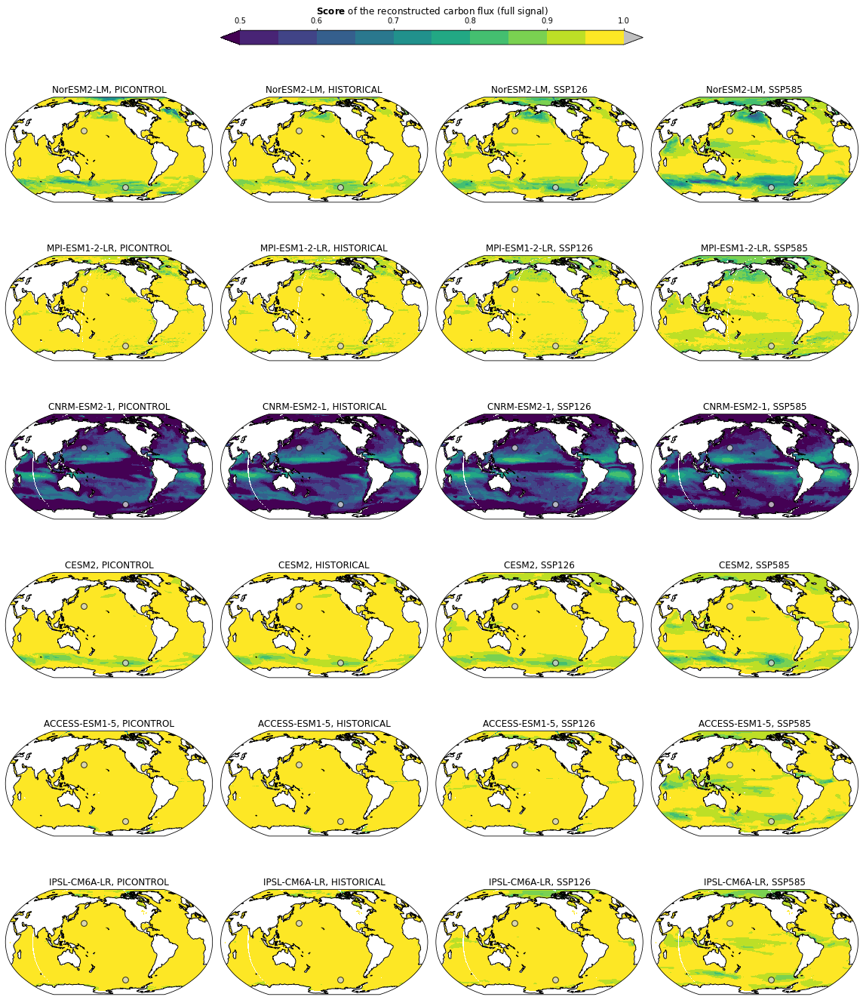

In [11]:
%%time
print(datetime.datetime.now())
print('Score analysis: maps score Y true vs Ypred, full signal, fig')

# Load data2plot
savedfile = dirout + 'data2plot-score-analysis-maps-score-ytrue-vs-ypred-full-signal-'+grid+'.pckl'
with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
print("File loaded: "+savedfile)        

    
#-----------------
# FIGURE PARAM
#-----------------

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 4, 3
nrow = len(model_list)
ncol = len(simu_list)
ccrsproj = ccrs.Robinson(central_longitude=-155)
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), 
                       subplot_kw=dict(projection=ccrsproj),
                       squeeze = False)


#-----------------
# CREATE CUSTOM CMAP
#-----------------

from matplotlib.colors import ListedColormap
from matplotlib import cm
cmap = cm.get_cmap('viridis', 256)
newcolors = cmap(np.linspace(0, 1, 10+1))
cmap = ListedColormap(newcolors[1:])
cmap.set_under(color=newcolors[0])
cmap.set_over(color='silver')

#-----------------
# KEYWORDS DICT
#-----------------

kwmap = {'vmin':.5, 'vmax':1, 'cmap':cmap, \
         'transform':ccrs.PlateCarree() }
kwscatter = dict(edgecolor='k', facecolor='lightgray', alpha = .8, s=60, \
                 transform=ccrs.PlateCarree())

#---------------------
# Plot
#---------------------

irow = 0
for model in model_list: 
       
    icol = 0
    for simu in simu_list: 
        
        zax = ax[irow, icol]
        X = data2plot[model][simu]['X']
        Y = data2plot[model][simu]['Y']
        Z = data2plot[model][simu]['Z']
        pcm = zax.pcolormesh(X, Y, Z, **kwmap)    
        zax.set_title(model+', '+simu.upper())
        zax.coastlines()
        # gl = zax.gridlines(crs=ccrs.PlateCarree(), linewidth=1)

        icol+=1
    #
    irow+=1
#

fig.tight_layout()

#---------------------
# Add point
#---------------------

for zax in ax.flatten(): 
    for gridpt in gridpt_list : 
        jj, ii = gridpt[0], gridpt[1]
        zax.scatter(X[jj, ii], Y[jj, ii], **kwscatter)
    #
#


#---------------------
# Colorbar
#---------------------

zw1 = ax[0, 1].get_position()
zw2 = ax[0, 2].get_position()
nx0 = zw1.x0
ny0 = zw1.y1 + .5*zw1.height
nw  = zw2.x1 - nx0
nh  = 0.03*nw
cax = fig.add_axes([nx0, ny0, nw, nh])
cbar = fig.colorbar(pcm, cax=cax, orientation='horizontal', \
                    ticklocation='top', extend='both')
cbar.set_label(r'${\bf Score}$ of the reconstructed carbon flux (full signal)', size=12)

#---------------------
# Save figure
#---------------------

fignam = 'score-analysis-maps-score-ytrue-vs-ypred-full-signal-'+grid+'.png'
fig.savefig(dirout+fignam, bbox_inches='tight')
print('Figure saved: '+fignam)

# ca. 30s

## Maps score Y true vs Ypred (dtrd deseas signal)

\begin{align}
score(Y, Y^{*}) &=& r2score(Y-\tilde Y, Y^* - \tilde Y) \\
&=& 1 - \frac{ \sum_{i=1}^{N}\left(y_i - y_i^* \right)^2 }{ \sum_{i=1}^{N}\left(y_i - \tilde y_i - \overline{Y - \tilde Y} \right)^2 } \\
&=& 1 - \frac{ MSE(Y, Y^*) }{ Var(Y - \tilde Y)} \\
or &=& 1 - \frac{ \sum_{i=1}^{N}\left(y_i - y_i^* \right)^2 }{ \sum_{i=1}^{N}\left[y_i - \left(\tilde y_i + \overline{Y - \tilde Y} \right) \right]^2 } \\
&=& 1 -\frac{ MSE(Y, Y^*) }{ MSE(Y, \tilde Y + \overline{Y - \tilde Y})}
\end{align}

### Prepare and save data2plot

In [12]:
%%time
print(datetime.datetime.now())
print('Score analysis: maps score Y true vs Ypred, dtrd deseas signal, prepare and save data2plot')

data2save = {}
for model in model_list: 

    print("> model:"+model)
    data2save[model] = {}
    
    for simu in simu_list: 

        print(">> simu: "+simu)
        data2save[model][simu] = {}

        #---------------
        # Data 
        #---------------

        savedfile = dirshared + 'score-std-' + model+'-'+simu+'-'+grid+'.pckl'
        with open(savedfile, 'rb') as f1: zwdata = pickle.load(f1)
        print("File loaded: "+savedfile)
        score = zwdata['totscor_avg'].T

        # adjust X and Y for pcolor
        X = zwdata['lon'].T
        zwX = np.append(X  , np.expand_dims(X[-1], axis=0), axis=0)
        zwX = np.append(zwX, np.expand_dims(180*np.ones_like(zwX[:, 0]), axis=1), axis=1)
        zwX = np.append(zwX, np.expand_dims(-184*np.ones_like(zwX[:, 0]), axis=1), axis=1)
        X = .5*(zwX + np.roll(zwX, 1, axis=1))[:, :-1]
        Y = zwdata['lat'].T
        zwY = np.append(Y  , np.expand_dims(Y[:, -1], axis=1), axis=1)
        zwY = np.append(zwY, np.expand_dims(90*np.ones_like(zwY[0]), axis=0), axis=0)
        zwY = np.append(zwY, np.expand_dims(-94*np.ones_like(zwY[0]), axis=0), axis=0)
        Y = .5*(zwY + np.roll(zwY, 1, axis=0))[:-1, :]    

        #---------------
        # Save data
        #---------------

        data2save[model][simu]['X'] = X
        data2save[model][simu]['Y'] = Y
        data2save[model][simu]['Z'] = score
        
    #
#

savedfile = dirout + 'data2plot-score-analysis-maps-score-ytrue-vs-ypred-dtrd-deseas-signal-'+grid+'.pckl'
if os.path.isfile(savedfile): os.remove(savedfile)
with open(savedfile, 'wb') as f1:pickle.dump(data2save, f1)
print("File saved: "+savedfile)        

# ca. 20s

2022-05-24 10:57:24.090092
Score analysis: maps score Y true vs Ypred, dtrd deseas signal, prepare and save data2plot
> model:NorESM2-LM
>> simu: picontrol
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/score-std-NorESM2-LM-picontrol-180x90.pckl
>> simu: historical
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/score-std-NorESM2-LM-historical-180x90.pckl
>> simu: ssp126
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/score-std-NorESM2-LM-ssp126-180x90.pckl
>> simu: ssp585
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/score-std-NorESM2-LM-ssp585-180x90.pckl
> model:MPI-ESM1-2-LR
>> simu: picontrol
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/score-std-MPI-ESM1-2-LR-picontrol-180x90.pckl
>> simu: historical
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/score-std-MPI-ESM1-2-LR-historical-180x90.pckl
>> 

### Fig

2022-05-24 10:57:35.935827
Score analysis: maps score Y true vs Ypred, dtrd deseas signal, fig
File loaded: dimred-220411/data2plot-score-analysis-maps-score-ytrue-vs-ypred-dtrd-deseas-signal-180x90.pckl
Figure saved: score-analysis-maps-score-ytrue-vs-ypred-dtrd-deseas-signal-180x90.png
CPU times: user 43.6 s, sys: 7.22 s, total: 50.8 s
Wall time: 30.9 s


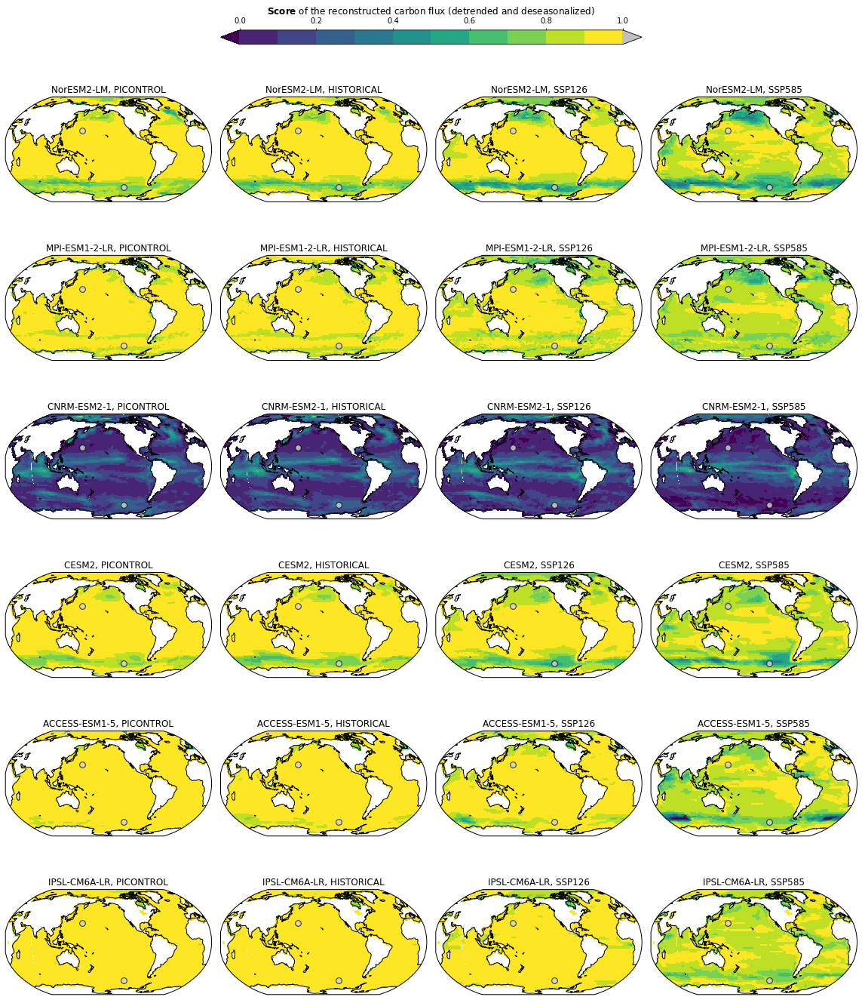

In [13]:
%%time
print(datetime.datetime.now())
print('Score analysis: maps score Y true vs Ypred, dtrd deseas signal, fig')

# Load data2plot
savedfile = dirout + 'data2plot-score-analysis-maps-score-ytrue-vs-ypred-dtrd-deseas-signal-'+grid+'.pckl'
with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
print("File loaded: "+savedfile)        

#-----------------
# FIGURE PARAM
#-----------------

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 4, 3
nrow = len(model_list)
ncol = len(simu_list)
ccrsproj = ccrs.Robinson(central_longitude=-155)
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), 
                       subplot_kw=dict(projection=ccrsproj),
                       squeeze = False)


#-----------------
# CREATE CUSTOM CMAP
#-----------------

from matplotlib.colors import ListedColormap
from matplotlib import cm
cmap = cm.get_cmap('viridis', 256)
newcolors = cmap(np.linspace(0, 1, 10+1))
cmap = ListedColormap(newcolors[1:])
cmap.set_under(color=newcolors[0])
cmap.set_over(color='silver')


#-----------------
# KEYWORDS DICT
#-----------------

kwmap = {'vmin':0, 'vmax':1, 'cmap':cmap, \
         'transform':ccrs.PlateCarree() }
kwscatter = dict(edgecolor='k', facecolor='lightgray', alpha = .8, s=60, \
                 transform=ccrs.PlateCarree())

#---------------------
# Plot
#---------------------

irow = 0
for model in model_list: 
    icol = 0
    for simu in simu_list: 

        zax = ax[irow, icol]
        X = data2plot[model][simu]['X']
        Y = data2plot[model][simu]['Y']
        Z = data2plot[model][simu]['Z']
        pcm = zax.pcolormesh(X, Y, Z, **kwmap)    
        zax.set_title(model+', '+simu.upper())
        zax.coastlines()
        # gl = zax.gridlines(crs=ccrs.PlateCarree(), linewidth=1)

        icol+=1

    #
    irow+=1
#
fig.tight_layout()

#---------------------
# Add point
#---------------------

for zax in ax.flatten(): 
    for gridpt in gridpt_list : 
        jj, ii = gridpt[0], gridpt[1]
        zax.scatter(X[jj, ii], Y[jj, ii], **kwscatter)
    #
#


#---------------------
# Colorbar
#---------------------

zw1 = ax[0, 1].get_position()
zw2 = ax[0, 2].get_position()
nx0 = zw1.x0
ny0 = zw1.y1 + .5*zw1.height
nw  = zw2.x1 - nx0
nh  = 0.03*nw
cax = fig.add_axes([nx0, ny0, nw, nh])
cbar = fig.colorbar(pcm, cax=cax, orientation='horizontal', \
                    ticklocation='top', extend='both')
cbar.set_label(r'${\bf Score}$ of the reconstructed carbon flux (detrended and deseasonalized)', size=12)


#---------------------
# Save figure
#---------------------

fignam = 'score-analysis-maps-score-ytrue-vs-ypred-dtrd-deseas-signal-'+grid+'.png'
fig.savefig(dirout+fignam, bbox_inches='tight')
print('Figure saved: '+fignam)


## Maps MSE(Ytrue, Ypred) (full signal) = numerator of the modified r2-score

\begin{align}
MSE(Y, Y^{*}) = \frac{1}{N}\sum_{i=1}^{N}\left(y_i - y_i^* \right)^2
\end{align}

### Prepare and save data2plot

In [45]:
%%time
print(datetime.datetime.now())
print('Score analysis: maps MSE(Ytrue, Ypred), full signal, prepare and save data2plot')

data2save = {}

for model in model_list: 
   
    print('> model: '+model)
    
    data2save[model] = {}
    
    for simu in simu_list: 

        print(">> simu:"+simu)
        
        data2save[model][simu] = {}

        #---------------
        # Data for computing score
        #---------------
        
        savedfile = dirshared + 'cfx-true-pred-std-' + model+'-'+simu+'-'+grid+'.pckl'
        with open(savedfile, 'rb') as f1: zwdata = pickle.load(f1)
        print("File loaded: "+savedfile)            
        cfxtrue = zwdata['cfxtrue'].T
        cfxpred = zwdata['cfxpred'].T

        # adjust X and Y for pcolor
        X = zwdata['lon'].T
        zwX = np.append(X  , np.expand_dims(X[-1], axis=0), axis=0)
        zwX = np.append(zwX, np.expand_dims(180*np.ones_like(zwX[:, 0]), axis=1), axis=1)
        zwX = np.append(zwX, np.expand_dims(-184*np.ones_like(zwX[:, 0]), axis=1), axis=1)
        X = .5*(zwX + np.roll(zwX, 1, axis=1))[:, :-1]
        Y = zwdata['lat'].T
        zwY = np.append(Y  , np.expand_dims(Y[:, -1], axis=1), axis=1)
        zwY = np.append(zwY, np.expand_dims(90*np.ones_like(zwY[0]), axis=0), axis=0)
        zwY = np.append(zwY, np.expand_dims(-94*np.ones_like(zwY[0]), axis=0), axis=0)
        Y = .5*(zwY + np.roll(zwY, 1, axis=0))[:-1, :]    

        #---------------
        # Compute score
        #---------------

        score1 = np.zeros_like(cfxtrue[0])
        ground = np.isnan(cfxtrue[0])    
        for jj in np.arange(score1.shape[0]): 
            for ii in np.arange(score1.shape[1]): 
                if not ground[jj, ii]: 
                    zwcfxtrue = cfxtrue[:, jj, ii]
                    zwcfxpred = cfxpred[:, jj, ii]
                    score1[jj, ii] = mean_squared_error(zwcfxtrue, zwcfxpred)                
                else : score1[jj, ii] = np.nan
            #
        #

        #---------------
        # Save data
        #---------------

        data2save[model][simu]['X'] = X
        data2save[model][simu]['Y'] = Y
        data2save[model][simu]['Z'] = score1
    #
#

savedfile = dirout + 'data2plot-score-analysis-maps-mse-ytrue-vs-ypred-full-signal-'+grid+'.pckl'
if os.path.isfile(savedfile): os.remove(savedfile)
with open(savedfile, 'wb') as f1:pickle.dump(data2save, f1)
print("File saved: "+savedfile)        

# ca. 22s

2022-04-20 15:07:53.308576
Score analysis: maps MSE(Ytrue, Ypred), full signal, prepare and save data2plot
> model: NorESM2-LM
>> simu:picontrol
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-picontrol-90x45.pckl
>> simu:historical
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-historical-90x45.pckl
>> simu:ssp126
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-ssp126-90x45.pckl
>> simu:ssp585
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-ssp585-90x45.pckl
> model: MPI-ESM1-2-LR
>> simu:picontrol
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-MPI-ESM1-2-LR-picontrol-90x45.pckl
>> simu:historical
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-MPI-ESM1-2-L

### Fig

2022-04-20 15:08:12.845666
Score analysis: maps MSE(Ytrue, Ypred), dtrd deseas signal, fig
File loaded: dimred-220411/data2plot-score-analysis-maps-mse-ytrue-vs-ypred-full-signal-90x45.pckl
Figure saved: score-analysis-maps-mse-ytrue-vs-ypred-full-signal-90x45.png
CPU times: user 43.1 s, sys: 9.12 s, total: 52.2 s
Wall time: 29.6 s


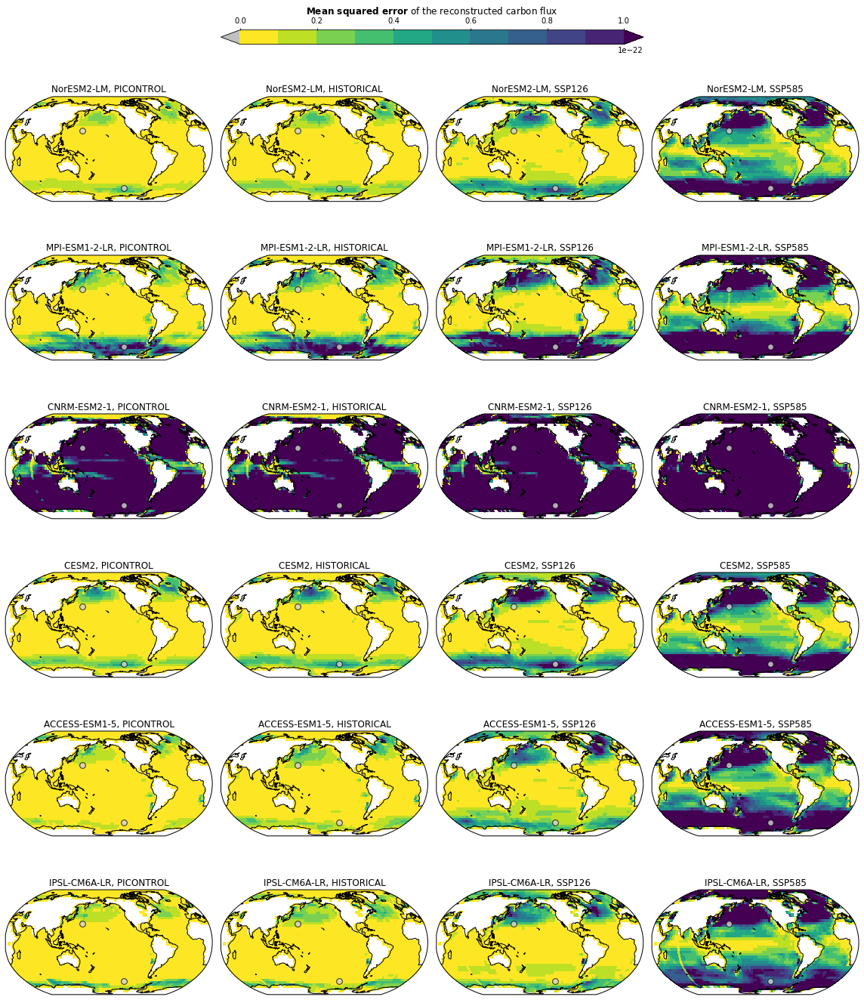

In [46]:
%%time
print(datetime.datetime.now())
print('Score analysis: maps MSE(Ytrue, Ypred), dtrd deseas signal, fig')

# Load data2plot
savedfile = dirout + 'data2plot-score-analysis-maps-mse-ytrue-vs-ypred-full-signal-'+grid+'.pckl'
with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
print("File loaded: "+savedfile)        

#-----------------
# FIGURE PARAM
#-----------------

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 4, 3
nrow = len(model_list)
ncol = len(simu_list)
ccrsproj = ccrs.Robinson(central_longitude=-155)
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), 
                       subplot_kw=dict(projection=ccrsproj),
                       squeeze = False)


#-----------------
# CREATE CUSTOM CMAP
#-----------------

from matplotlib.colors import ListedColormap
from matplotlib import cm
cmap = cm.get_cmap('viridis_r', 256)
newcolors = cmap(np.linspace(0, 1, 10+1))
cmap = ListedColormap(newcolors[:-1])
cmap.set_under(color='silver')
cmap.set_over(color=newcolors[-1])

#-----------------
# KEYWORDS DICT
#-----------------

# kwmap = {'vmin':0, 'vmax':1, 'cmap':cmap, \
#          'transform':ccrs.PlateCarree() }
kwmap = {'vmin':0, 'vmax':1e-22, 'cmap':cmap, \
         'transform':ccrs.PlateCarree() }
kwscatter = dict(edgecolor='k', facecolor='lightgray', alpha = .8, s=60, \
                 transform=ccrs.PlateCarree())

#---------------------
# Plot
#---------------------

irow = 0
for model in model_list: 
    icol = 0
    for simu in simu_list: 

        zax = ax[irow, icol]
        X = data2plot[model][simu]['X']
        Y = data2plot[model][simu]['Y']
        Z = data2plot[model][simu]['Z']
        # pcm = zax.pcolormesh(X, Y, Z/np.nanmean(Z), **kwmap)    
        # zax.set_title('%s, %s\n %.1e' %(model, simu.upper(), np.nanmean(Z)))
        pcm = zax.pcolormesh(X, Y, Z, **kwmap)    
        zax.set_title('%s, %s' %(model, simu.upper()))
        zax.coastlines()
        # gl = zax.gridlines(crs=ccrs.PlateCarree(), linewidth=1)

        icol+=1

    #
    irow+=1
#
fig.tight_layout()

#---------------------
# Add point
#---------------------

for zax in ax.flatten(): 
    for gridpt in gridpt_list : 
        jj, ii = gridpt[0], gridpt[1]
        zax.scatter(X[jj, ii], Y[jj, ii], **kwscatter)
    #
#


#---------------------
# Colorbar
#---------------------

zw1 = ax[0, 1].get_position()
zw2 = ax[0, 2].get_position()
nx0 = zw1.x0
ny0 = zw1.y1 + .5*zw1.height
nw  = zw2.x1 - nx0
nh  = 0.03*nw
cax = fig.add_axes([nx0, ny0, nw, nh])
cbar = fig.colorbar(pcm, cax=cax, orientation='horizontal', \
                    ticklocation='top', extend='both')
cbar.set_label(r'${\bf Mean\ squared\ error}$ of the reconstructed carbon flux', size=12)

#---------------------
# Save figure
#---------------------

fignam = 'score-analysis-maps-mse-ytrue-vs-ypred-full-signal-'+grid+'.png'
fig.savefig(dirout+fignam, bbox_inches='tight')
print('Figure saved: '+fignam)

# ca. 30s

## Maps variance Ytrue (dtrd deseas signal) = denominator of the modified r2-score

\begin{align}
\frac{1}{N} \sum_{i=1}^{N} \left(y_i - \tilde y_i - \overline{Y - \tilde Y} \right)^2   &=&   Var(Y - \tilde Y) \\
\mbox{Or:   } \frac{1}{N} \sum_{i=1}^{N} \left(y_i - \left(\tilde y_i + \overline{Y - \tilde Y} \right) \right)^2 &=& MSE(Y, \tilde Y + \overline{Y - \tilde Y})
\end{align}

### Prepare and save data2plot

In [47]:
%%time
print(datetime.datetime.now())
print('Score analysis: maps variance Ytrue, dtrd deseas signal, prepare and save data2plot')

data2save = {}

for model in model_list: 
   
    print('> model: '+model)
    
    data2save[model] = {}
    
    for simu in simu_list: 

        print(">> simu:"+simu)
        
        data2save[model][simu] = {}

        #---------------
        # Data for computing score
        #---------------
        
        savedfile = dirshared + 'cfx-true-pred-std-' + model+'-'+simu+'-'+grid+'.pckl'
        with open(savedfile, 'rb') as f1: zwdata = pickle.load(f1)
        print("File loaded: "+savedfile)            
        cfxtrue = zwdata['cfxtrue'].T

        # adjust X and Y for pcolor
        X = zwdata['lon'].T
        zwX = np.append(X  , np.expand_dims(X[-1], axis=0), axis=0)
        zwX = np.append(zwX, np.expand_dims(180*np.ones_like(zwX[:, 0]), axis=1), axis=1)
        zwX = np.append(zwX, np.expand_dims(-184*np.ones_like(zwX[:, 0]), axis=1), axis=1)
        X = .5*(zwX + np.roll(zwX, 1, axis=1))[:, :-1]
        Y = zwdata['lat'].T
        zwY = np.append(Y  , np.expand_dims(Y[:, -1], axis=1), axis=1)
        zwY = np.append(zwY, np.expand_dims(90*np.ones_like(zwY[0]), axis=0), axis=0)
        zwY = np.append(zwY, np.expand_dims(-94*np.ones_like(zwY[0]), axis=0), axis=0)
        Y = .5*(zwY + np.roll(zwY, 1, axis=0))[:-1, :]    

        #---------------
        # Compute variance of detrended and deseasonalized signal
        #---------------

        score1 = np.zeros_like(cfxtrue[0])
        ground = np.isnan(cfxtrue[0])    
        for jj in np.arange(score1.shape[0]): 
            for ii in np.arange(score1.shape[1]): 
                if not ground[jj, ii]: 
                    zwcfxtrue = cfxtrue[:, jj, ii]
                    # trend
                    t = np.linspace(0, zwcfxtrue.shape[0] - 1, num=zwcfxtrue.shape[0])
                    trd = p_smooth_spline(t, zwcfxtrue)
                    # dtrd, dseas
                    zwcfxtrue_dtrd_dseas, trdseas, seas = dtrd_dseas(zwcfxtrue, trd)
                    score1[jj, ii] = np.var(zwcfxtrue_dtrd_dseas)                
                else : score1[jj, ii] = np.nan
            #
        #

        #---------------
        # Save data
        #---------------

        data2save[model][simu]['X'] = X
        data2save[model][simu]['Y'] = Y
        data2save[model][simu]['Z'] = score1
    #
#

savedfile = dirout + 'data2plot-score-analysis-maps-var-ytrue-dtrd-deseas-signal-'+grid+'.pckl'
if os.path.isfile(savedfile): os.remove(savedfile)
with open(savedfile, 'wb') as f1:pickle.dump(data2save, f1)
print("File saved: "+savedfile)        

# ca. 5s

2022-04-20 15:08:44.651291
Score analysis: maps variance Ytrue, dtrd deseas signal, prepare and save data2plot
> model: NorESM2-LM
>> simu:picontrol
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-picontrol-90x45.pckl
>> simu:historical
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-historical-90x45.pckl
>> simu:ssp126
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-ssp126-90x45.pckl
>> simu:ssp585
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-ssp585-90x45.pckl
> model: MPI-ESM1-2-LR
>> simu:picontrol
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-MPI-ESM1-2-LR-picontrol-90x45.pckl
>> simu:historical
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-MPI-ESM1

### Fig

2022-04-20 15:10:22.998514
Score analysis: maps variance Ytrue), dtrd deseas signal, fig
File loaded: dimred-220411/data2plot-score-analysis-maps-var-ytrue-dtrd-deseas-signal-90x45.pckl
Figure saved: score-analysis-maps-var-ytrue-dtrd-deseas-signal-90x45.png
CPU times: user 41.3 s, sys: 8.59 s, total: 49.9 s
Wall time: 28.5 s


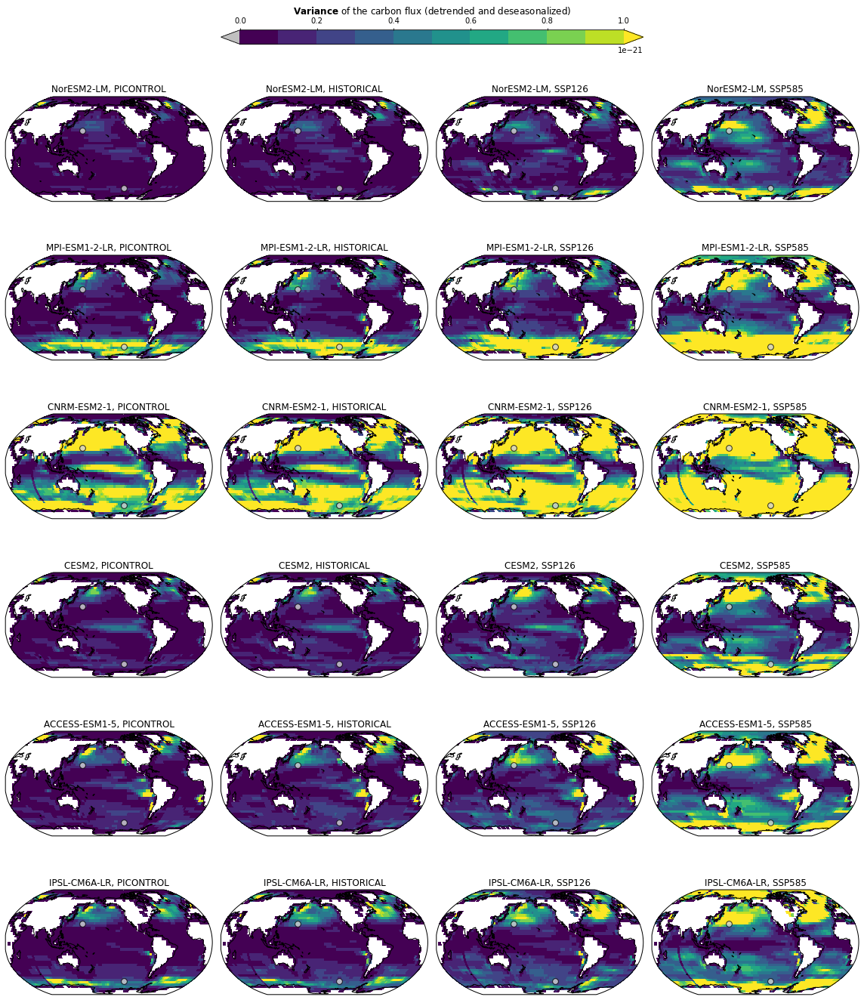

In [48]:
%%time
print(datetime.datetime.now())
print('Score analysis: maps variance Ytrue), dtrd deseas signal, fig')

# Load data2plot
savedfile = dirout + 'data2plot-score-analysis-maps-var-ytrue-dtrd-deseas-signal-'+grid+'.pckl'
with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
print("File loaded: "+savedfile)        

#-----------------
# FIGURE PARAM
#-----------------

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 4, 3
nrow = len(model_list)
ncol = len(simu_list)
ccrsproj = ccrs.Robinson(central_longitude=-155)
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), 
                       subplot_kw=dict(projection=ccrsproj),
                       squeeze = False)


#-----------------
# CREATE CUSTOM CMAP
#-----------------

from matplotlib.colors import ListedColormap
from matplotlib import cm
cmap = cm.get_cmap('viridis', 256)
newcolors = cmap(np.linspace(0, 1, 10+1))
cmap = ListedColormap(newcolors[:-1])
cmap.set_under(color='silver')
cmap.set_over(color=newcolors[-1])

#-----------------
# KEYWORDS DICT
#-----------------

# kwmap = {'vmin':0, 'vmax':1, 'cmap':cmap, \
#          'transform':ccrs.PlateCarree() }
kwmap = {'vmin':0, 'vmax':1e-21, 'cmap':cmap, \
         'transform':ccrs.PlateCarree() }
kwscatter = dict(edgecolor='k', facecolor='lightgray', alpha = .8, s=60, \
                 transform=ccrs.PlateCarree())

#---------------------
# Plot
#---------------------

irow = 0
for model in model_list: 
    icol = 0
    for simu in simu_list: 

        zax = ax[irow, icol]
        X = data2plot[model][simu]['X']
        Y = data2plot[model][simu]['Y']
        Z = data2plot[model][simu]['Z']
        # pcm = zax.pcolormesh(X, Y, Z/np.nanmean(Z), **kwmap)    
        # zax.set_title('%s, %s\n %.1e' %(model, simu.upper(), np.nanmean(Z)))
        pcm = zax.pcolormesh(X, Y, Z, **kwmap)    
        zax.set_title('%s, %s' %(model, simu.upper()))
        zax.coastlines()
        # gl = zax.gridlines(crs=ccrs.PlateCarree(), linewidth=1)

        icol+=1

    #
    irow+=1
#

fig.tight_layout()

#---------------------
# Add point
#---------------------

for zax in ax.flatten(): 
    for gridpt in gridpt_list : 
        jj, ii = gridpt[0], gridpt[1]
        zax.scatter(X[jj, ii], Y[jj, ii], **kwscatter)
    #
#

#---------------------
# Colorbar
#---------------------

zw1 = ax[0, 1].get_position()
zw2 = ax[0, 2].get_position()
nx0 = zw1.x0
ny0 = zw1.y1 + .5*zw1.height
nw  = zw2.x1 - nx0
nh  = 0.03*nw
cax = fig.add_axes([nx0, ny0, nw, nh])
cbar = fig.colorbar(pcm, cax=cax, orientation='horizontal', \
                    ticklocation='top', extend='both')
cbar.set_label(r'${\bf Variance}$ of the carbon flux (detrended and deseasonalized)', size=12)

#---------------------
# Save figure
#---------------------

fignam = 'score-analysis-maps-var-ytrue-dtrd-deseas-signal-'+grid+'.png'
fig.savefig(dirout+fignam, bbox_inches='tight')
print('Figure saved: '+fignam)

# ca. 30s

## Scatter plot score vs MSE vs variance

### Means values

2022-04-20 15:26:31.430395
Score analysis: scatter plot score vs MSE vs variance
> Load data2plot
File loaded: dimred-220411/data2plot-score-analysis-maps-score-ytrue-vs-ypred-dtrd-deseas-signal-90x45.pckl
File loaded: dimred-220411/data2plot-score-analysis-maps-mse-ytrue-vs-ypred-full-signal-90x45.pckl
File loaded: dimred-220411/data2plot-score-analysis-maps-var-ytrue-dtrd-deseas-signal-90x45.pckl
CPU times: user 882 ms, sys: 182 ms, total: 1.06 s
Wall time: 514 ms


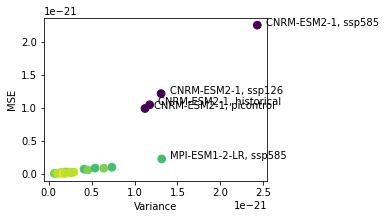

In [73]:
%%time
print(datetime.datetime.now())
print('Score analysis: scatter plot score vs MSE vs variance')

#---------------------
# Load data2plot
#---------------------

print("> Load data2plot")

savedfile = dirout + 'data2plot-score-analysis-maps-score-ytrue-vs-ypred-dtrd-deseas-signal-'+grid+'.pckl'
with open(savedfile, 'rb') as f1: data2plot_score = pickle.load(f1)
print("File loaded: "+savedfile)        

savedfile = dirout + 'data2plot-score-analysis-maps-mse-ytrue-vs-ypred-full-signal-'+grid+'.pckl'
with open(savedfile, 'rb') as f1: data2plot_mse = pickle.load(f1)
print("File loaded: "+savedfile)        

savedfile = dirout + 'data2plot-score-analysis-maps-var-ytrue-dtrd-deseas-signal-'+grid+'.pckl'
with open(savedfile, 'rb') as f1: data2plot_var = pickle.load(f1)
print("File loaded: "+savedfile)        

#-----------------
# FIGURE PARAM
#-----------------

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 4, 3
nrow = 1
ncol = 1
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow))


#-----------------
# CREATE CUSTOM CMAP
#-----------------

from matplotlib.colors import ListedColormap
from matplotlib import cm
cmap = cm.get_cmap('viridis', 256)
newcolors = cmap(np.linspace(0, 1, 10+1))
cmap = ListedColormap(newcolors[1:])
cmap.set_under(color=newcolors[0])
cmap.set_over(color='silver')


#-----------------
# KEYWORDS DICT
#-----------------

kwscatter = {'vmin':.5, 'vmax':1, 'cmap':cmap, 's':60}

#-----------------
# PLOT
#-----------------

X, Y, Z = [], [], []
for model in model_list: 
    for simu in simu_list: 
        X.append(np.nanmean(data2plot_var  [model][simu]['Z']))
        Y.append(np.nanmean(data2plot_mse  [model][simu]['Z']))
        Z.append(np.nanmean(data2plot_score[model][simu]['Z']))
    #
#
ax.scatter(X, Y, c=Z, **kwscatter)
ax.set_xlabel('Variance')
ax.set_ylabel('MSE')

for model in model_list: 
    for simu in simu_list: 
        X = np.nanmean(data2plot_var  [model][simu]['Z'])
        Y = np.nanmean(data2plot_mse  [model][simu]['Z'])
        if X>1e-21: ax.annotate('%s, %s'%(model, simu), (X, Y), (X+1e-22, Y))
    #
#


### grid point values

2022-04-20 16:41:32.921134
Score analysis: scatter plot score vs MSE vs variance
> Load data2plot
File loaded: dimred-220411/data2plot-score-analysis-maps-score-ytrue-vs-ypred-dtrd-deseas-signal-90x45.pckl
File loaded: dimred-220411/data2plot-score-analysis-maps-mse-ytrue-vs-ypred-full-signal-90x45.pckl
File loaded: dimred-220411/data2plot-score-analysis-maps-var-ytrue-dtrd-deseas-signal-90x45.pckl
CPU times: user 12 s, sys: 3.03 s, total: 15.1 s
Wall time: 7.93 s


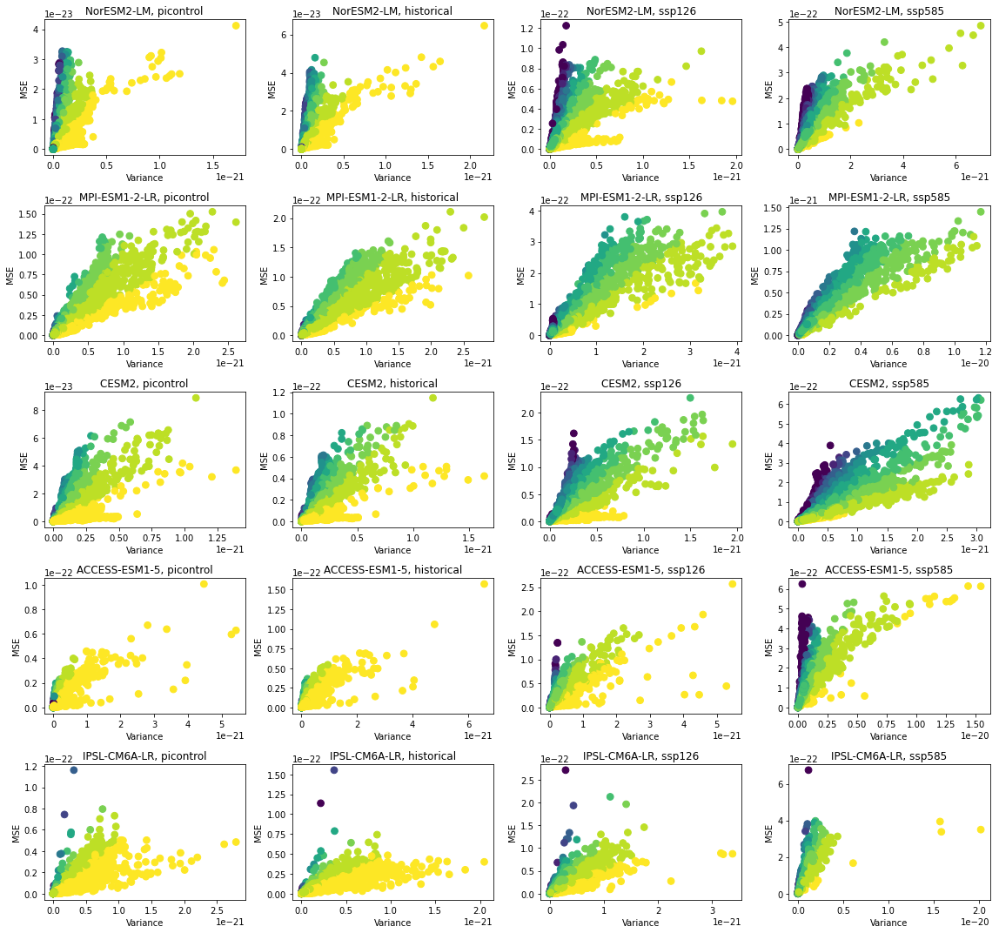

In [93]:
%%time
print(datetime.datetime.now())
print('Score analysis: scatter plot score vs MSE vs variance')

#---------------------
# Load data2plot
#---------------------

print("> Load data2plot")

savedfile = dirout + 'data2plot-score-analysis-maps-score-ytrue-vs-ypred-dtrd-deseas-signal-'+grid+'.pckl'
with open(savedfile, 'rb') as f1: data2plot_score = pickle.load(f1)
print("File loaded: "+savedfile)        

savedfile = dirout + 'data2plot-score-analysis-maps-mse-ytrue-vs-ypred-full-signal-'+grid+'.pckl'
with open(savedfile, 'rb') as f1: data2plot_mse = pickle.load(f1)
print("File loaded: "+savedfile)        

savedfile = dirout + 'data2plot-score-analysis-maps-var-ytrue-dtrd-deseas-signal-'+grid+'.pckl'
with open(savedfile, 'rb') as f1: data2plot_var = pickle.load(f1)
print("File loaded: "+savedfile)        

#-----------------
# FIGURE PARAM
#-----------------

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 4, 3
nrow = len(model_list)
ncol = len(simu_list)
# fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), 
#                       sharex=True, sharey=True)
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow))


#-----------------
# CREATE CUSTOM CMAP
#-----------------

from matplotlib.colors import ListedColormap
from matplotlib import cm
cmap = cm.get_cmap('viridis', 256)
newcolors = cmap(np.linspace(0, 1, 10+1))
cmap = ListedColormap(newcolors[1:])
cmap.set_under(color=newcolors[0])
cmap.set_over(color='silver')


#-----------------
# KEYWORDS DICT
#-----------------

kwscatter = {'vmin':.5, 'vmax':1, 'cmap':cmap, 's':60}

#-----------------
# PLOT
#-----------------

X, Y, Z = [], [], []
for irow, model in enumerate(model_list): 
    for icol, simu in enumerate(simu_list): 
        X = data2plot_var  [model][simu]['Z']
        Y = data2plot_mse  [model][simu]['Z']
        Z = data2plot_score[model][simu]['Z']
        ax[irow, icol].scatter(X, Y, c=Z, **kwscatter)
        ax[irow, icol].set_xlabel('Variance')
        ax[irow, icol].set_ylabel('MSE')
        ax[irow, icol].set_title('%s, %s'%(model, simu))
    #
#

fig.tight_layout()

# for model in model_list: 
#     for simu in simu_list: 
#         X = np.nanmean(data2plot_var  [model][simu]['Z'])
#         Y = np.nanmean(data2plot_mse  [model][simu]['Z'])
#         if X>1e-21: ax.annotate('%s, %s'%(model, simu), (X, Y), (X+1e-22, Y))
#     #
# #


## Time series Y true vs Ypred (full signal)

2022-04-22 11:21:15.070180
Fig: time series Y true vs Ypred (full signal)
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-MPI-ESM1-2-LR-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-CNRM-ESM2-1-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-CESM2-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-ACCESS-ESM1-5-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-IPSL-CM6A-LR-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-historical-90x45.pckl
File loaded: /mnt/reef-ns

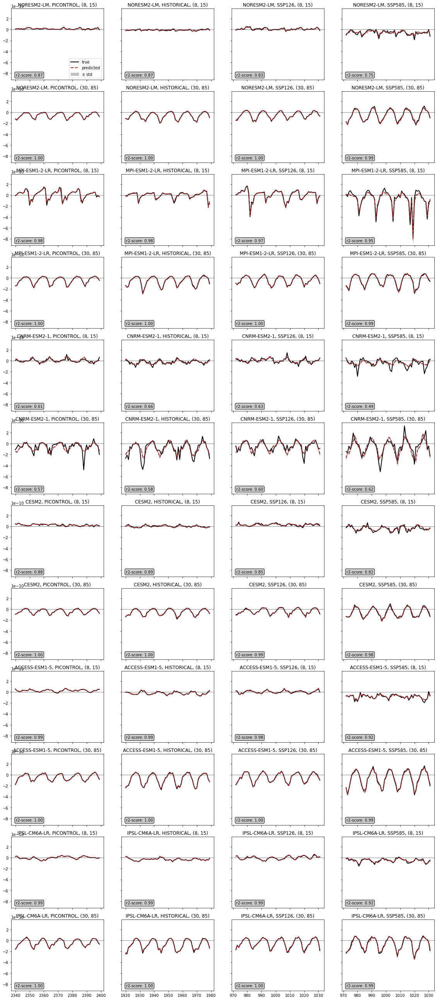

In [8]:
%%time
print(datetime.datetime.now())
print('Fig: time series Y true vs Ypred (full signal)')

#-----------------
# FIGURE PARAM
#-----------------

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 4, 3
ncol = len(simu_list)
nrow = len(gridpt_list)*len(model_list)
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), squeeze=False, \
                      sharey=True, sharex='col')

#-----------------
# KEYWORDS DICT
#-----------------

kwtrue = dict(lw=2, ls='-' , label='true'     , color='k')
kwpred = dict(lw=2, ls='--', label='predicted', color='firebrick')
kwstd = dict(label='$\pm$ std', color='silver')

kwbbox = dict(boxstyle ="round", fc ="0.8")

    
icol = 0
for simu in simu_list: 

    irow = 0

    for model in model_list: 
        
        #---------------
        # Data for computing score
        #---------------
        savedfile = dirshared + 'cfx-true-pred-std-' + model+'-'+simu+'-'+grid+'.pckl'
        with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
        print("File loaded: "+savedfile)            
        cfxtrue = data2plot['cfxtrue'].T
        cfxpred = data2plot['cfxpred'].T

        #---------------
        # Loop on grid point
        #---------------

        for gridpt in gridpt_list: 

            jj, ii = gridpt[0], gridpt[1]
            cfxtrue = data2plot['cfxtrue'][ii, jj, :].squeeze()
            cfxpred = data2plot['cfxpred'][ii, jj, :].squeeze()
            cfxstd  = data2plot['cfxstd' ][ii, jj, :].squeeze()

            cfxsup = cfxpred + cfxstd
            cfxinf = cfxpred - cfxstd

            #---------------
            # 1 year average cfxtrue        
            #---------------
            zw = []
            for yyy in np.arange(0, len(cfxtrue), 12) : 
                zw.append(np.nanmean(cfxtrue[yyy:yyy+12]))
            #
            cfxtrue_ya = np.array(zw)

            #---------------
            # 1 year average cfxpred                
            #---------------
            zw = []
            for yyy in np.arange(0, len(cfxpred), 12) : 
                zw.append(np.nanmean(cfxpred[yyy:yyy+12]))
            #
            cfxpred_ya = np.array(zw)        

            #---------------
            # 1 year average cfxsup             
            #---------------
            zw = []
            for yyy in np.arange(0, len(cfxsup), 12) : 
                zw.append(np.nanmean(cfxsup[yyy:yyy+12]))
            #
            cfxsup_ya = np.array(zw)        

            #---------------
            # 1 year average cfxinf                
            #---------------
            zw = []
            for yyy in np.arange(0, len(cfxinf), 12) : 
                zw.append(np.nanmean(cfxinf[yyy:yyy+12]))
            #
            cfxinf_ya = np.array(zw)        

            #---------------
            # Plot
            #---------------
            zax = ax[irow, icol]
            
           #X1=np.arange(len(cfxtrue_ya))
           #llstd   = zax.fill_between(X1, cfxinf_ya, cfxsup_ya, **kwstd)
           #lltrue, = zax.plot(X1, cfxtrue_ya , **kwtrue)
           #llpred, = zax.plot(X1, cfxpred_ya , **kwpred)
            
            X1=np.arange(len(cfxtrue))[-5*12:]
            llstd   = zax.fill_between(X1, cfxinf[-5*12:], cfxsup[-5*12:], **kwstd)
            lltrue, = zax.plot(X1, cfxtrue[-5*12:], **kwtrue)
            llpred, = zax.plot(X1, cfxpred[-5*12:], **kwpred)
            
            zax.axhline(0, lw=.5, c='k')
            zax.set_title(model.upper()+', '+simu.upper() + ', ' + str(gridpt))


            #---------------
            # Score
            #---------------    
            xxx, yyy = cfxtrue, cfxpred
            zax.annotate('r2-score: %.2f' %r2_score(xxx, yyy), (0.05, 0.05), xycoords='axes fraction', bbox=kwbbox) 

            irow+=1

        #
    #
    icol+=1
#

ax[0, 0].legend(loc='lower right')

fig.tight_layout()

fignam = 'score-analysis-timeseries-ytrue-vs-ypred-full-signal.png'
fig.savefig(dirout+fignam, bbox_inches='tight')
print('Figure saved: '+fignam)

# ca. 50s

## Time series Y true vs Ypred (dtrd deseas signal)

2022-04-22 11:22:02.060227
Fig: time series Y true vs Ypred (dtrd deseas signal)
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-NorESM2-LM-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/score-std-NorESM2-LM-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-MPI-ESM1-2-LR-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/score-std-MPI-ESM1-2-LR-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-CNRM-ESM2-1-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/score-std-CNRM-ESM2-1-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/cfx-true-pred-std-CESM2-picontrol-90x45.pckl
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYT

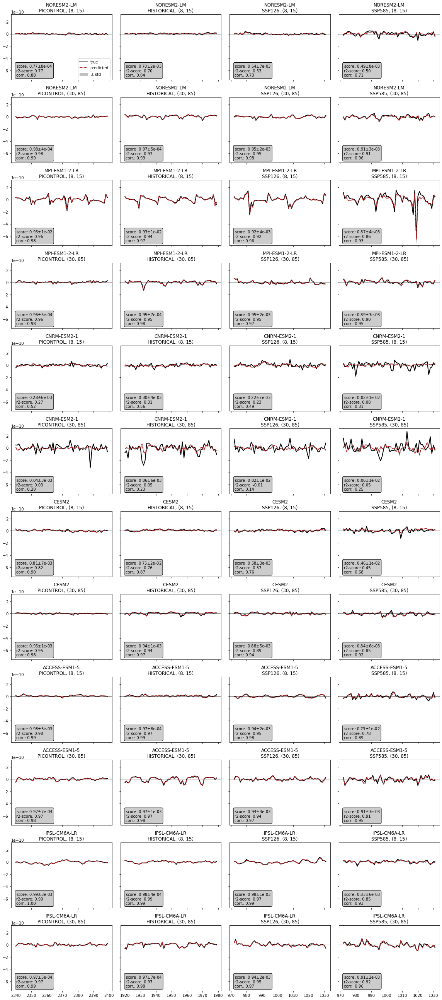

In [9]:
%%time
print(datetime.datetime.now())
print('Fig: time series Y true vs Ypred (dtrd deseas signal)')

#-----------------
# FIGURE PARAM
#-----------------

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 4, 3
ncol = len(simu_list)
nrow = len(gridpt_list)*len(model_list)
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), squeeze=False, \
                      sharey=True, sharex='col')

#-----------------
# KEYWORDS DICT
#-----------------

kwtrue = dict(lw=2, ls='-' , label='true'     , color='k')
kwpred = dict(lw=2, ls='--', label='predicted', color='firebrick')
kwstd = dict(label='$\pm$ std', color='silver')

kwbbox = dict(boxstyle ="round", fc ="0.8")

    
icol = 0
for simu in simu_list: 

    irow = 0

    for model in model_list: 
        
        #---------------
        # Data for computing score
        #---------------
        savedfile = dirshared + 'cfx-true-pred-std-' + model+'-'+simu+'-'+grid+'.pckl'
        with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
        print("File loaded: "+savedfile)            

        #---------------
        # Data score
        #---------------

        savedfile = dirshared + 'score-std-' + model+'-'+simu+'-'+grid+'.pckl'
        with open(savedfile, 'rb') as f1: zwdatascore = pickle.load(f1)
        print("File loaded: "+savedfile)

        #---------------
        # Loop on grid point
        #---------------

        for gridpt in gridpt_list: 

            jj, ii = gridpt[0], gridpt[1]
            cfxtrue = data2plot['cfxtrue'][ii, jj, :].squeeze()
            cfxpred = data2plot['cfxpred'][ii, jj, :].squeeze()
            cfxstd  = data2plot['cfxstd' ][ii, jj, :].squeeze()
            scostd  = zwdatascore['totscor_std' ][ii, jj]
            scoavg  = zwdatascore['totscor_avg' ][ii, jj]

            cfxsup = cfxpred + cfxstd
            cfxinf = cfxpred - cfxstd

            #---------------
            # detrend and deseasonalized        
            #---------------
            
            t = np.linspace(0, cfxtrue.shape[0] - 1, num=cfxtrue.shape[0])
            trd = p_smooth_spline(t, cfxtrue)

            cfxtrue_dtrd_dseas, trdseas, seas = dtrd_dseas(cfxtrue, trd)
            cfxpred_dtrd_dseas, trdseas, seas = dtrd_dseas(cfxpred, trd)
            cfxinf_dtrd_dseas , trdseas, seas = dtrd_dseas(cfxinf , trd)
            cfxsup_dtrd_dseas , trdseas, seas = dtrd_dseas(cfxsup , trd)
            
            #---------------
            # 1 year average        
            #---------------
            
            #_______________
            # cfxtrue
            zw = []
            for yyy in np.arange(0, len(cfxtrue_dtrd_dseas), 12) : 
                zw.append(np.nanmean(cfxtrue_dtrd_dseas[yyy:yyy+12]))
            #
            cfxtrue_dtrd_dseas_ya = np.array(zw)
            #_______________
            # cfxpred
            zw = []
            for yyy in np.arange(0, len(cfxpred_dtrd_dseas), 12) : 
                zw.append(np.nanmean(cfxpred_dtrd_dseas[yyy:yyy+12]))
            #
            cfxpred_dtrd_dseas_ya = np.array(zw)        
            #_______________
            # cfxinf            
            zw = []
            for yyy in np.arange(0, len(cfxinf_dtrd_dseas), 12) : 
                zw.append(np.nanmean(cfxinf_dtrd_dseas[yyy:yyy+12]))
            #
            cfxinf_dtrd_dseas_ya = np.array(zw)     
            #_______________
            # cfxsup
            zw = []
            for yyy in np.arange(0, len(cfxsup_dtrd_dseas), 12) : 
                zw.append(np.nanmean(cfxsup_dtrd_dseas[yyy:yyy+12]))
            #
            cfxsup_dtrd_dseas_ya = np.array(zw)        


            #---------------
            # Plot
            #---------------
            zax = ax[irow, icol]
            
            X1=np.arange(len(cfxinf_dtrd_dseas))[-12*5:]
            llstd   = zax.fill_between(X1, cfxinf_dtrd_dseas[-12*5:], cfxsup_dtrd_dseas[-12*5:], **kwstd)
            lltrue, = zax.plot(X1, cfxtrue_dtrd_dseas[-12*5:], **kwtrue)
            llpred, = zax.plot(X1, cfxpred_dtrd_dseas[-12*5:], **kwpred)

            #X1=np.arange(len(trdseas))
            #lltrue, = zax.plot(X1, trdseas, **kwtrue)

            #X1=np.arange(len(seas))[:24]
            #lltrue, = zax.plot(X1, seas[:24], **kwtrue)

            zax.axhline(0, lw=.5, c='k')
            zax.set_title(model.upper()+'\n'+simu.upper() + ', ' + str(gridpt))


            #---------------
            # Score
            #---------------    
            xxx, yyy = cfxtrue_dtrd_dseas, cfxpred_dtrd_dseas
            zax.annotate('score: %.2f$\pm$%.e\nr2-score: %.2f\ncorr.: %.2f' \
                         %(scoavg, scostd, r2_score(xxx, yyy), pearsonr(xxx, yyy)[0]),\
                         (0.05, 0.05), xycoords='axes fraction', bbox=kwbbox) 

            irow+=1

        #
    #
    icol+=1
#

ax[0, 0].legend(loc='lower right')

fig.tight_layout()

fignam = 'score-analysis-timeseries-ytrue-vs-ypred-dtrd-deseas-signal.png'
fig.savefig(dirout+fignam, bbox_inches='tight')
print('Figure saved: '+fignam)

# ca. 40s

# Feature importance analysis

## Inputs

In [89]:
%%time
print(datetime.datetime.now())
print('Score analysis: inputs')

# model_list = ['NorESM2-LM', 'MPI-ESM1-2-LR', 'CNRM-ESM2-1', 'CESM2', 'ACCESS-ESM1-5', 'IPSL-CM6A-LR']
model_list = ['NorESM2-LM', 'MPI-ESM1-2-LR', 'CESM2', 'ACCESS-ESM1-5', 'IPSL-CM6A-LR']
simu_list  = ['picontrol', 'historical', 'ssp126', 'ssp585']
#grid_list  = ['90x45', '180x90']
grid  = '90x45'

# Create and add a Rectangle patch
gridpt_list = [(8, 15), (30, 85)]

2022-04-20 16:39:28.542989
Score analysis: inputs
CPU times: user 238 µs, sys: 42 µs, total: 280 µs
Wall time: 186 µs


## Maps of the 3 most important features and sum of FI

### Select features, save as pckl

In [90]:
%%time
print(datetime.datetime.now())
print('Feature importance analysis: Maps of the 3 most important features and sum of FI, select features, save as pckl')

data2save = {}

for model in model_list: 
    
    print("> model: "+model)
    data2save[model] = {}
    
    for simu in simu_list: 

        print(">> "+simu)
        data2save[model][simu] = {}


        print('>>> load ordered features')
        savedfile = dirshared + 'ordered-fi-std-' + model + '-' + simu + '-' + grid + '.pckl'
        with open(savedfile, 'rb') as f1: ordered_features = pickle.load(f1)
        print("File loaded: "+savedfile)

        print('>>> compute sumfi')
        sumfi = ordered_features['features']['feature 0']['fi'] + \
                ordered_features['features']['feature 1']['fi'] + \
                ordered_features['features']['feature 2']['fi']

        # some features used later
        ground = np.isnan(sumfi)
        nlon, nlat = sumfi.shape

        print('>>> compute the combinaisons of the 3 most important feature')

        # select the 3 most important feature
        f0 = ordered_features['features']['feature 0']['fname'].flatten() + 1
        f1 = ordered_features['features']['feature 1']['fname'].flatten() + 1
        f2 = ordered_features['features']['feature 2']['fname'].flatten() + 1
        zw = np.array([f0, f1, f2], dtype=int).T

        # create a matrix with a unique 3 digit number for each combinaison of features
        zw.sort(axis=1)
        f012=np.zeros_like(zw[:, 0])
        for idx, val in enumerate(zw): 
            if not ground.flat[idx] : f012[idx]=''.join(str(x) for x in val)
            else: f012[idx]=-1
        #

        # compute the distribution of each feature combinaison
        dens, bins = np.histogram(f012, bins = np.arange(1000), density=True)

        # select the most frequent combinaison (threshold 3 percent of the grid point)
        zwidx, = np.where(dens>0.02)
        zw = np.array(sorted(zip(dens[zwidx], bins[zwidx]))[::-1])
        code = np.array(zw[:, 1], dtype=int) # the unique code for the combinaison of the 3 most important features

        # for each combinaison associate a unique number
        # the position of the combinaison in code will 
        # then give the color of the gridpoint.
        # Eg. if code=[145, 147, 134, 157], then
        # 145 is associated with 0
        f012bis = np.zeros_like(f012, dtype=float) - 1
        for nnn, vvv in enumerate(code): 
            zwidx = np.where(f012.flatten()==vvv)
            f012bis[zwidx] = nnn 
        #
        f012bis[ground.flatten()] = np.nan
        f012bis = np.reshape(f012bis, (nlon, nlat)) # reshape to get a 2d matrix


        # set feature_names_idx
        zw = ordered_features['feature_names_idx']
        feature_names_idx = {}
        for kkk, vvv in zw.items(): feature_names_idx[str(vvv+1)] = kkk

        # set code_reverse
        # code_reverse associate the 3 digit combinaison of code with the
        # name of the feature. Eg: 145 -> dissic, talk, tos
        coder=[]
        for nn, vv in enumerate(code): 
            vv2=[int(x) for x in str(vv)]
            vv3=''
            for ii in vv2: vv3 = vv3+feature_names_idx[str(ii)]+', '
            coder.append(vv3[:-2])
        #

        # save
        data2save[model][simu]['lat'              ] = ordered_features['lat']                    
        data2save[model][simu]['lon'              ] = ordered_features['lon'] 
        data2save[model][simu]['sumfi'            ] = sumfi                   
        data2save[model][simu]['code'             ] = code                    
        data2save[model][simu]['code_reverse'     ] = coder                   
        data2save[model][simu]['feature_names_idx'] = feature_names_idx      
        data2save[model][simu]['f012'             ] = f012bis
    #
#



savedfile = dirout + 'data2plot-fi-analysis-maps-3-most-important-features-and-sumfi-'+grid+'.pckl'
if os.path.isfile(savedfile): os.remove(savedfile)
with open(savedfile, 'wb') as f1:pickle.dump(data2save, f1)
print("File saved: "+savedfile)        

    

    

2022-04-20 16:39:41.538534
Feature importance analysis: Maps of the 3 most important features and sum of FI, select features, save as pckl
> model: NorESM2-LM
>> picontrol
>>> load ordered features
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-NorESM2-LM-picontrol-90x45.pckl
>>> compute sumfi
>>> compute the combinaisons of the 3 most important feature
>> historical
>>> load ordered features
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-NorESM2-LM-historical-90x45.pckl
>>> compute sumfi
>>> compute the combinaisons of the 3 most important feature
>> ssp126
>>> load ordered features
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-NorESM2-LM-ssp126-90x45.pckl
>>> compute sumfi
>>> compute the combinaisons of the 3 most important feature
>> ssp585
>>> load ordered features
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/or

### Fig sumfi

2022-04-20 16:39:46.325357
Feature importance analysis: Maps of the 3 most important features and sum of FI, fig sumfi
File loaded: dimred-220411/data2plot-fi-analysis-maps-3-most-important-features-and-sumfi-90x45.pckl
Figure saved: fi-analysis-maps-3-most-important-features-sumfi-90x45.png
CPU times: user 28.7 s, sys: 5.52 s, total: 34.2 s
Wall time: 20.3 s


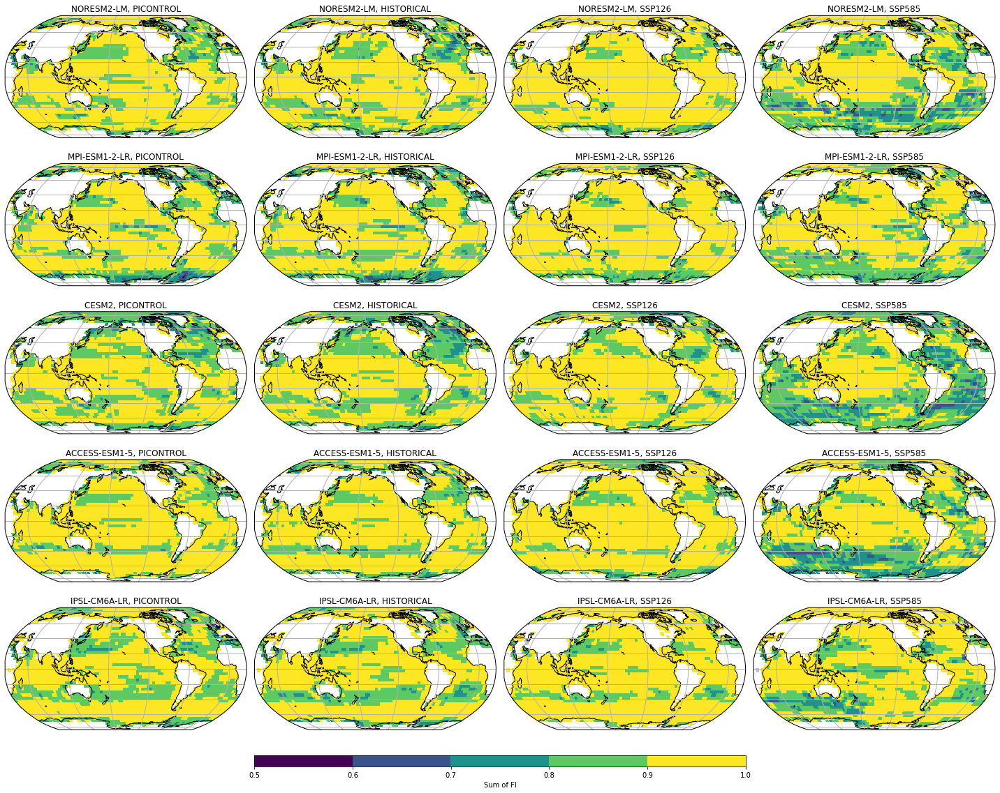

In [91]:
%%time
print(datetime.datetime.now())
print('Feature importance analysis: Maps of the 3 most important features and sum of FI, fig sumfi')

# Load data2plot
savedfile = dirout + 'data2plot-fi-analysis-maps-3-most-important-features-and-sumfi-'+grid+'.pckl'
with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
print("File loaded: "+savedfile)        

#====================
# FIGURE PARAM
#====================

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 5, 3
ncol = len(simu_list)
nrow = len(model_list)
ccrsproj = ccrs.Robinson(central_longitude=-155)
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), 
                      subplot_kw=dict(projection=ccrsproj))

#====================
# FIGURE PARAM FOR:
# THE SUM OF THE 3 MOST IMP FEAT
#====================


from matplotlib.colors import ListedColormap
from matplotlib import cm
cmap = cm.get_cmap('viridis', 256)
newcolors = cmap(np.linspace(0, 1, 5))
cmap = ListedColormap(newcolors)
cmap.set_under(color='silver')
cmap.set_over(color='silver')

vmin, vmax = .5, 1

kw_sumfi = dict( cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree() )

#====================
# Plot
#====================

for imodel, vmodel in enumerate(model_list): 
    
    for isimu, vsimu in enumerate(simu_list): 

        # adjust X and Y for pcolor
        X = data2plot[vmodel][vsimu]['lon'].T
        zwX = np.append(X  , np.expand_dims(X[-1], axis=0), axis=0)
        zwX = np.append(zwX, np.expand_dims(180*np.ones_like(zwX[:, 0]), axis=1), axis=1)
        zwX = np.append(zwX, np.expand_dims(-184*np.ones_like(zwX[:, 0]), axis=1), axis=1)
        X = .5*(zwX + np.roll(zwX, 1, axis=1))[:, :-1]
        Y = data2plot[vmodel][vsimu]['lat'].T
        zwY = np.append(Y  , np.expand_dims(Y[:, -1], axis=1), axis=1)
        zwY = np.append(zwY, np.expand_dims(90*np.ones_like(zwY[0]), axis=0), axis=0)
        zwY = np.append(zwY, np.expand_dims(-94*np.ones_like(zwY[0]), axis=0), axis=0)
        Y = .5*(zwY + np.roll(zwY, 1, axis=0))[:-1, :]

        zax = ax[imodel, isimu]    
        Z = data2plot[vmodel][vsimu]['sumfi'].T
        pcmsumfi = zax.pcolormesh(X, Y, Z, **kw_sumfi)
        zax.set_title(vmodel.upper()+', '+vsimu.upper())
        zax.coastlines()
        gl = zax.gridlines(crs=ccrs.PlateCarree(), linewidth=1)

    #
#
fig.tight_layout()


#====================
# COLORBAR SUMFI
#====================
zw1 = ax[-1, 1].get_position()
zw2 = ax[-1, 2].get_position()
nx0 = zw1.x0
ny0 = zw1.y0 - .3*zw1.height
nw  = zw2.x1 - nx0
nh  = 0.03*nw
cax = fig.add_axes([nx0, ny0, nw, nh])
cbar = fig.colorbar(pcmsumfi, cax=cax, orientation='horizontal', ticklocation='bottom', 
                    label = 'Sum of FI')

#====================
# SAVEFIG
#====================

fignam = 'fi-analysis-maps-3-most-important-features-sumfi-'+grid+'.png'
fig.savefig(dirout+fignam, bbox_inches='tight')
print('Figure saved: '+fignam)

### Fig 3 most features

2022-04-20 16:40:08.292032
Feature importance analysis: Maps of the 3 most important features and sum of FI, fig sumfi
File loaded: dimred-220411/data2plot-fi-analysis-maps-3-most-important-features-and-sumfi-90x45.pckl
Figure saved: fi-analysis-maps-3-most-important-features-90x45.png
CPU times: user 1min 30s, sys: 5.38 s, total: 1min 35s
Wall time: 1min 22s


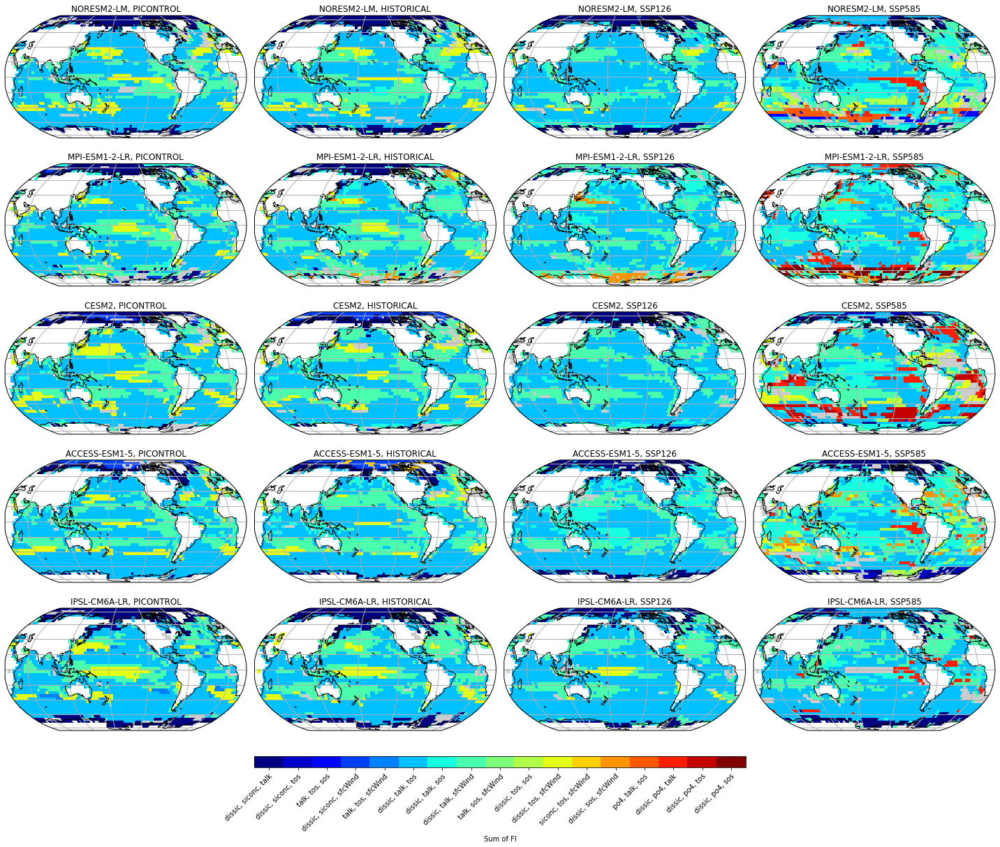

In [92]:
%%time
print(datetime.datetime.now())
print('Feature importance analysis: Maps of the 3 most important features and sum of FI, fig sumfi')

# Load data2plot
savedfile = dirout + 'data2plot-fi-analysis-maps-3-most-important-features-and-sumfi-'+grid+'.pckl'
with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
print("File loaded: "+savedfile)        

#====================
# FIGURE PARAM
#====================

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 5, 3
ncol = len(simu_list)
nrow = len(model_list)
ccrsproj = ccrs.Robinson(central_longitude=-155)
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), 
                      subplot_kw=dict(projection=ccrsproj))

#====================
# FIGURE PARAM FOR:
# THE 3 MOST IMP FEATURES
#====================

codes = {}
for mmm in model_list: 
    codes[mmm]={}
    for sss in simu_list: 
        codes[mmm][sss] = data2plot[mmm][sss]['code']
    #
#

#____________________
# SET COMMON CODE and CODE_REVERSE
# code_reverse associate the 3 digit combinaison of code with the
# name of the feature. Eg: 145 -> dissic, talk, tos
common_code = set()
for kkk1, vvv1 in codes.items(): 
    for kkk2, vvv2 in vvv1.items(): 
        common_code = common_code | set(vvv2)
    #
#
common_code = list(common_code)
common_coder=[]
for nn, vv in enumerate(common_code): 
    vv2=[int(x) for x in str(vv)]
    vv3=''
    for ii in vv2: vv3 = vv3 + data2plot[model_list[0]][simu_list[0]]['feature_names_idx'][str(ii)]+', '
    common_coder.append(vv3[:-2])
#

#____________________
# SET CODEKEY 
# for each 3 digit combinaison from common_code,
# associate the number that will be plotted for each simulation
# eg. for 134 -> 'picontrol':2, 'historical': 2, 'ssp126':1, 'ssp585':3
# this will allow us to have the same colormap for each simulations
codes = {}
for mmm in model_list: 
    codes[mmm] = {}
    for sss in simu_list: 
        codes[mmm][sss] = data2plot[mmm][sss]['code']
    #
#
codekey = {}
for ccc in common_code: 
    codekey[str(ccc)] = {}
    for kkk1, vvv1 in codes.items(): 
        codekey[str(ccc)][kkk1] = {}
        for kkk2, vvv2 in vvv1.items():
            zwidx = list(np.where(vvv2 == ccc)[0])
            if len(zwidx)==1 : codekey[str(ccc)][kkk1][kkk2]=int(zwidx[0])
            elif len(zwidx)==0 : codekey[str(ccc)][kkk1][kkk2]=None
            else: exit('ERROR too many values in zwidx')
        #
    #
#

#____________________
# CREATE COMMON COLORMAP
from matplotlib.colors import ListedColormap
from matplotlib import cm
nbin = len(common_code)
cmap = cm.get_cmap('jet', 256)
newcolors = cmap(np.linspace(0, 1, nbin))
cmap = ListedColormap(newcolors)
cmap.set_bad(color='.8')
cmap.set_under(color='.8')
cmap.set_over(color='.5')
vmin, vmax = -.5, nbin-.5

kw_f012 = dict( cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree() )

#====================
# Plot
#====================

for imodel, vmodel in enumerate(model_list): 
    
    for isimu, vsimu in enumerate(simu_list): 

        # adjust X and Y for pcolor
        X = data2plot[vmodel][vsimu]['lon'].T
        zwX = np.append(X  , np.expand_dims(X[-1], axis=0), axis=0)
        zwX = np.append(zwX, np.expand_dims(180*np.ones_like(zwX[:, 0]), axis=1), axis=1)
        zwX = np.append(zwX, np.expand_dims(-184*np.ones_like(zwX[:, 0]), axis=1), axis=1)
        X = .5*(zwX + np.roll(zwX, 1, axis=1))[:, :-1]
        Y = data2plot[vmodel][vsimu]['lat'].T
        zwY = np.append(Y  , np.expand_dims(Y[:, -1], axis=1), axis=1)
        zwY = np.append(zwY, np.expand_dims(90*np.ones_like(zwY[0]), axis=0), axis=0)
        zwY = np.append(zwY, np.expand_dims(-94*np.ones_like(zwY[0]), axis=0), axis=0)
        Y = .5*(zwY + np.roll(zwY, 1, axis=0))[:-1, :]

        # change color code to match commonn colormap
        zw1 = data2plot[vmodel][vsimu]['f012']
        nlon, nlat = zw1.shape    # some features
        zw1 = zw1.flatten()
        zwgrd = np.isnan(zw1)
        zw2 = np.zeros_like(zw1) - 1
        for nnn, ccc in enumerate(common_code): 
            zwck  = codekey[str(ccc)][vmodel][vsimu]
            zw2 = np.where(zw1 == zwck, nnn, zw2)
        #
        zw2[zwgrd] = np.nan
        Z = np.reshape(zw2, (nlon, nlat)).T

        zax = ax[imodel, isimu] 
        pcf012 = zax.pcolor(X, Y, Z, **kw_f012)
        zax.set_title(vmodel.upper()+', '+vsimu.upper())
        zax.coastlines()
        gl = zax.gridlines(crs=ccrs.PlateCarree(), linewidth=1)

    #
#
fig.tight_layout()


#====================
# COLORBAR SUMFI
#====================
zw1 = ax[-1, 1].get_position()
zw2 = ax[-1, 2].get_position()
nx0 = zw1.x0
ny0 = zw1.y0 - .3*zw1.height
nw  = zw2.x1 - nx0
nh  = 0.03*nw
cax = fig.add_axes([nx0, ny0, nw, nh])
cbar = fig.colorbar(pcf012, cax=cax, orientation='horizontal', ticklocation='bottom', 
                    label = 'Sum of FI')


cbar.set_ticks([x for x, _ in enumerate(common_coder)])
cbar.set_ticklabels([str(x) for x in common_coder])
plt.setp(cbar.ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

#====================
# SAVEFIG
#====================

fignam = 'fi-analysis-maps-3-most-important-features-'+grid+'.png'
fig.savefig(dirout+fignam, bbox_inches='tight')
print('Figure saved: '+fignam)

## Maps of feature from more to less important

In [8]:
model_list = ['NorESM2-LM', 'MPI-ESM1-2-LR', 'CNRM-ESM2-1', 'CESM2', 'ACCESS-ESM1-5', 'IPSL-CM6A-LR']
simu_list  = ['picontrol', 'historical', 'ssp126', 'ssp585']

row_list = ['NorESM2-LM', 'MPI-ESM1-2-LR', 'CNRM-ESM2-1', 'CESM2', 'ACCESS-ESM1-5', 'IPSL-CM6A-LR']
modorsimu = 'picontrol'
grid       = '90x45'


### Without feature importance

2022-04-25 11:56:41.254028
Feature importance analysis: Maps of feature from more to less important, without feature importance
> NorESM2-LM
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-NorESM2-LM-picontrol-90x45.pckl
> MPI-ESM1-2-LR
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-MPI-ESM1-2-LR-picontrol-90x45.pckl
> CNRM-ESM2-1
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-CNRM-ESM2-1-picontrol-90x45.pckl
> CESM2
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-CESM2-picontrol-90x45.pckl
> ACCESS-ESM1-5
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-ACCESS-ESM1-5-picontrol-90x45.pckl
> IPSL-CM6A-LR
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-IPSL-CM6A-LR-picontrol-90x45.pckl
Figure saved: fi-analysis-maps-featu

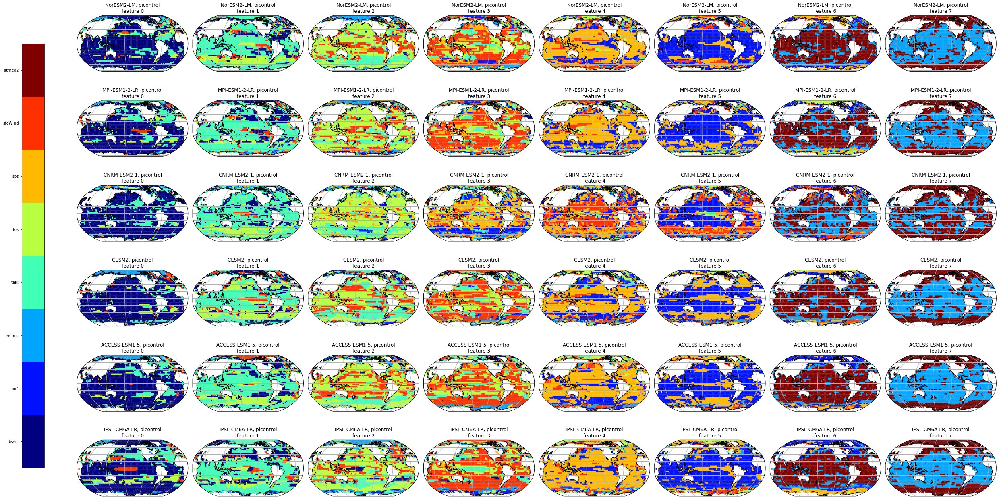

In [9]:
%%time
print(datetime.datetime.now())
print('Feature importance analysis: Maps of feature from more to less important, without feature importance')

from matplotlib.patches import Rectangle, Patch

#---------------------
# SET  N_FEATURES
#---------------------

if modorsimu in simu_list:
    savedfile = dirshared + 'ordered-fi-std-' + row_list[0] + '-' + modorsimu + '-' + grid  + '.pckl'
elif modorsimu in model_list: 
    savedfile = dirshared + 'ordered-fi-std-' + modorsimu + '-' + row_list[0] + '-' + grid  + '.pckl'
#
else: exit('Something wrong with modorsimu')
with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
n_features = len(data2plot['feature_names_idx'].items())

#---------------------
# FIGURE PARAM
#---------------------

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 4, 3
ncol = n_features
nrow = len(row_list)
ccrsproj = ccrs.Robinson(central_longitude=-155)
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), 
                      subplot_kw=dict(projection=ccrsproj))
# fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), squeeze=False)

#---------------------
# CREATE CUSTOM CMAP
#---------------------

from matplotlib.colors import ListedColormap
from matplotlib import cm
nbin = np.int(n_features)
cmap = cm.get_cmap('jet', 256)
newcolors = cmap(np.linspace(0, 1, nbin))
cmap = ListedColormap(newcolors)
cmap.set_bad(color='.5')


map_kwargs= {'vmin':-.5, 'vmax':n_features-.5, 'cmap':cmap, \
             'edgecolors':'face', \
             'transform':ccrs.PlateCarree() }

# map_kwargs= {'vmin':-.5, 'vmax':n_features-.5, 'cmap':cmap}

#---------------------
# PLOT
#---------------------

for irow, vrow in enumerate(row_list): 

    print("> "+vrow)
    
    if modorsimu in simu_list:
        savedfile = dirshared + 'ordered-fi-std-' + vrow + '-' + modorsimu + '-' + grid  + '.pckl'
        title = vrow + ', ' + modorsimu
    elif modorsimu in model_list: 
        savedfile = dirshared + 'ordered-fi-std-' + modorsimu + '-' + vrow + '-' + grid  + '.pckl'
        title = modorsimu + ', ' + vrow
    else: exit('Something wrong with modorsimu')
    with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
    print("File loaded: "+savedfile)

    # adjust X and Y for pcolor
    X = data2plot['lon'].T
    zwX = np.append(X  , np.expand_dims(X[-1], axis=0), axis=0)
    zwX = np.append(zwX, np.expand_dims(180*np.ones_like(zwX[:, 0]), axis=1), axis=1)
    zwX = np.append(zwX, np.expand_dims(-184*np.ones_like(zwX[:, 0]), axis=1), axis=1)
    X = .5*(zwX + np.roll(zwX, 1, axis=1))[:, :-1]
    Y = data2plot['lat'].T
    zwY = np.append(Y  , np.expand_dims(Y[:, -1], axis=1), axis=1)
    zwY = np.append(zwY, np.expand_dims(90*np.ones_like(zwY[0]), axis=0), axis=0)
    zwY = np.append(zwY, np.expand_dims(-94*np.ones_like(zwY[0]), axis=0), axis=0)
    Y = .5*(zwY + np.roll(zwY, 1, axis=0))[:-1, :]
    
    for ifeature, (kfeature, vfeature) in enumerate(data2plot['features'].items()) : 
        icol = ifeature
        zax = ax[irow, icol]
        Z = vfeature['fname'].T
        mmm = zax.pcolor(X, Y, Z, **map_kwargs)
        zax.set_title(title + '\n' + kfeature)
        zax.coastlines()
        gl = zax.gridlines(crs=ccrs.PlateCarree(), linewidth=1)
    #
#
fig.tight_layout()

#---------------------
# COLORBAR
#---------------------


zw1 = ax[ 0, 0].get_position()
zw2 = ax[-1, 0].get_position()
nx0 = zw2.x0 - .5*zw2.width
ny0 = zw2.y0 + 0.5*zw2.height
nh  = zw1.y0 + 0.5*zw1.height - ny0
nw  = 0.03*nh
cax = fig.add_axes([nx0, ny0, nw, nh])
cbar = fig.colorbar(mmm, cax=cax, ticks=np.arange(n_features), ticklocation='left')
cbar.ax.set_yticklabels(list(data2plot['feature_names_idx'].keys()))

#---------------------
# SAVE FIG
#---------------------

fignam = 'fi-analysis-maps-feature-more-to-less-important-nofi-'+modorsimu+'-'+grid+'.png'
fig.savefig(dirout+fignam, bbox_inches='tight')
print('Figure saved: '+fignam)

# ca. 2m

### Feature importances

2022-04-25 11:59:59.822362
Feature importance analysis: maps of feature from more to less important, feature importances
> NorESM2-LM
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-NorESM2-LM-picontrol-90x45.pckl
> MPI-ESM1-2-LR
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-MPI-ESM1-2-LR-picontrol-90x45.pckl
> CNRM-ESM2-1
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-CNRM-ESM2-1-picontrol-90x45.pckl
> CESM2
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-CESM2-picontrol-90x45.pckl
> ACCESS-ESM1-5
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-ACCESS-ESM1-5-picontrol-90x45.pckl
> IPSL-CM6A-LR
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-IPSL-CM6A-LR-picontrol-90x45.pckl
Figure saved: fi-analysis-maps-feature-more

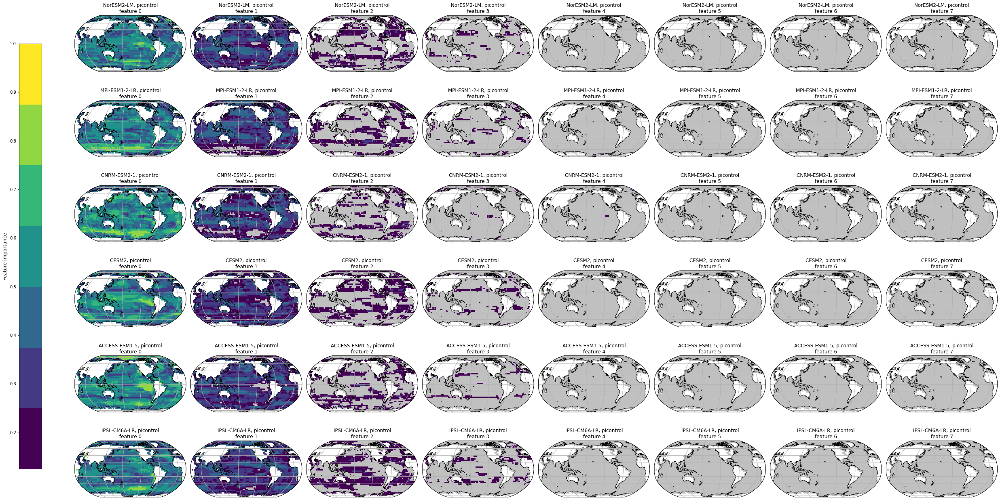

In [10]:
%%time
print(datetime.datetime.now())
print('Feature importance analysis: maps of feature from more to less important, feature importances')

from matplotlib.patches import Rectangle, Patch

#---------------------
# SET  N_FEATURES
#---------------------

if modorsimu in simu_list:
    savedfile = dirshared + 'ordered-fi-std-' + row_list[0] + '-' + modorsimu + '-' + grid  + '.pckl'
elif modorsimu in model_list: 
    savedfile = dirshared + 'ordered-fi-std-' + modorsimu + '-' + row_list[0] + '-' + grid  + '.pckl'
#
else: exit('Something wrong with modorsimu')
with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
n_features = len(data2plot['feature_names_idx'].items())

#---------------------
# FIGURE PARAM
#---------------------

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 4, 3
ncol = n_features
nrow = len(row_list)
ccrsproj = ccrs.Robinson(central_longitude=-155)
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), 
                      subplot_kw=dict(projection=ccrsproj))
# fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), squeeze=False)

#---------------------
# MAP KWARGS
#---------------------

from matplotlib.colors import ListedColormap
from matplotlib import cm
cmap = cm.get_cmap('viridis', 256)
newcolors = cmap(np.linspace(0, 1, n_features-1))
cmap = ListedColormap(newcolors)
cmap.set_under(color='silver')
cmap.set_over(color='silver')

vmin, vmax = 1/n_features, 1

map_kwargs = dict( cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree() )

#---------------------
# PLOT
#---------------------

for irow, vrow in enumerate(row_list): 

    print("> "+vrow)
    
    if modorsimu in simu_list:
        savedfile = dirshared + 'ordered-fi-std-' + vrow + '-' + modorsimu + '-' + grid  + '.pckl'
        title = vrow + ', ' + modorsimu
    elif modorsimu in model_list: 
        savedfile = dirshared + 'ordered-fi-std-' + modorsimu + '-' + vrow + '-' + grid  + '.pckl'
        title = modorsimu + ', ' + vrow
    else: exit('Something wrong with modorsimu')
    with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
    print("File loaded: "+savedfile)

    # adjust X and Y for pcolor
    X = data2plot['lon'].T
    zwX = np.append(X  , np.expand_dims(X[-1], axis=0), axis=0)
    zwX = np.append(zwX, np.expand_dims(180*np.ones_like(zwX[:, 0]), axis=1), axis=1)
    zwX = np.append(zwX, np.expand_dims(-184*np.ones_like(zwX[:, 0]), axis=1), axis=1)
    X = .5*(zwX + np.roll(zwX, 1, axis=1))[:, :-1]
    Y = data2plot['lat'].T
    zwY = np.append(Y  , np.expand_dims(Y[:, -1], axis=1), axis=1)
    zwY = np.append(zwY, np.expand_dims(90*np.ones_like(zwY[0]), axis=0), axis=0)
    zwY = np.append(zwY, np.expand_dims(-94*np.ones_like(zwY[0]), axis=0), axis=0)
    Y = .5*(zwY + np.roll(zwY, 1, axis=0))[:-1, :]
    
    for ifeature, (kfeature, vfeature) in enumerate(data2plot['features'].items()) : 
        icol = ifeature
        zax = ax[irow, icol]
        Z = vfeature['fi'].T
        mmm = zax.pcolor(X, Y, Z, **map_kwargs)
        zax.set_title(title + '\n' + kfeature)
        zax.coastlines()
        gl = zax.gridlines(crs=ccrs.PlateCarree(), linewidth=1)
    #
#
fig.tight_layout()

#---------------------
# COLORBAR
#---------------------


zw1 = ax[ 0, 0].get_position()
zw2 = ax[-1, 0].get_position()
nx0 = zw2.x0 - .5*zw2.width
ny0 = zw2.y0 + 0.5*zw2.height
nh  = zw1.y0 + 0.5*zw1.height - ny0
nw  = 0.03*nh
cax = fig.add_axes([nx0, ny0, nw, nh])
cbar = fig.colorbar(mmm, cax=cax, orientation='vertical', \
                    ticklocation='left')
cbar.set_label('Feature importance', size=12)


#---------------------
# SAVE FIG
#---------------------

fignam = 'fi-analysis-maps-feature-more-to-less-important-feature-importances-'+modorsimu+'-'+grid+'.png'
fig.savefig(dirout+fignam, bbox_inches='tight')
print('Figure saved: '+fignam)

# ca. 2m

### With feature importance as alpha

2022-04-20 17:26:06.159139
Feature importance analysis: Maps of feature from more to less important, feature importance as alpha
> picontrol
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-NorESM2-LM-picontrol-90x45.pckl
> historical
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-NorESM2-LM-picontrol-90x45.pckl
> ssp126
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-NorESM2-LM-picontrol-90x45.pckl
> ssp585
File loaded: /mnt/reef-ns1002k/daco/MY_JUPYTER_NOTEBOOKS/DIM-RED/SHARED-DATAS/ordered-fi-std-NorESM2-LM-picontrol-90x45.pckl
Figure saved: fi-analysis-maps-feature-more-to-less-important-with-fi-NorESM2-LM-90x45.png
CPU times: user 2min 38s, sys: 8.43 s, total: 2min 47s
Wall time: 2min 26s


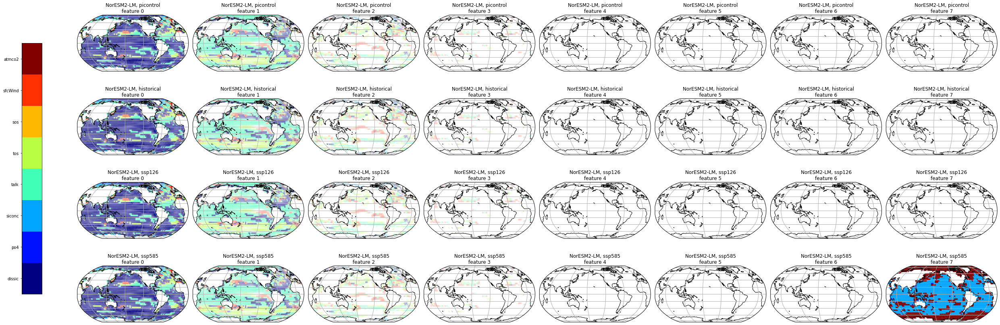

In [109]:
%%time
print(datetime.datetime.now())
print('Feature importance analysis: Maps of feature from more to less important, feature importance as alpha')

from matplotlib.patches import Rectangle, Patch

#---------------------
# SET  N_FEATURES
#---------------------

if modorsimu in simu_list:
    savedfile = dirshared + 'ordered-fi-std-' + row_list[0] + '-' + modorsimu + '-' + grid  + '.pckl'
elif modorsimu in model_list: 
    savedfile = dirshared + 'ordered-fi-std-' + modorsimu + '-' + row_list[0] + '-' + grid  + '.pckl'
#
else: exit('Something wrong with modorsimu')
with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
n_features = len(data2plot['feature_names_idx'].items())

#---------------------
# FIGURE PARAM
#---------------------

cm2in = 1/2.54 # converting factor cm to inch 
xfsize, yfsize = 4, 3
ncol = n_features
nrow = len(row_list)
ccrsproj = ccrs.Robinson(central_longitude=-155)
fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), 
                      subplot_kw=dict(projection=ccrsproj))
# fig, ax = plt.subplots(nrow, ncol, figsize=(xfsize*ncol,yfsize*nrow), squeeze=False)

#---------------------
# CREATE CUSTOM CMAP
#---------------------

from matplotlib.colors import ListedColormap
from matplotlib import cm
nbin = np.int(n_features)
cmap = cm.get_cmap('jet', 256)
newcolors = cmap(np.linspace(0, 1, nbin))
cmap = ListedColormap(newcolors)
cmap.set_bad(color='.5')


map_kwargs= {'vmin':-.5, 'vmax':n_features-.5, 'cmap':cmap, \
             'edgecolors':'face', \
             'transform':ccrs.PlateCarree() }

# map_kwargs= {'vmin':-.5, 'vmax':n_features-.5, 'cmap':cmap}

#---------------------
# PLOT
#---------------------

for irow, vrow in enumerate(row_list): 

    print("> "+vrow)
    
    if modorsimu in simu_list:
        savedfile = dirshared + 'ordered-fi-std-' + row_list[0] + '-' + modorsimu + '-' + grid  + '.pckl'
        title = vrow + ', ' + modorsimu
    elif modorsimu in model_list: 
        savedfile = dirshared + 'ordered-fi-std-' + modorsimu + '-' + row_list[0] + '-' + grid  + '.pckl'
        title = modorsimu + ', ' + vrow
    else: exit('Something wrong with modorsimu')
    with open(savedfile, 'rb') as f1: data2plot = pickle.load(f1)
    print("File loaded: "+savedfile)

    # adjust X and Y for pcolor
    X = data2plot['lon'].T
    zwX = np.append(X  , np.expand_dims(X[-1], axis=0), axis=0)
    zwX = np.append(zwX, np.expand_dims(180*np.ones_like(zwX[:, 0]), axis=1), axis=1)
    zwX = np.append(zwX, np.expand_dims(-184*np.ones_like(zwX[:, 0]), axis=1), axis=1)
    X = .5*(zwX + np.roll(zwX, 1, axis=1))[:, :-1]
    Y = data2plot['lat'].T
    zwY = np.append(Y  , np.expand_dims(Y[:, -1], axis=1), axis=1)
    zwY = np.append(zwY, np.expand_dims(90*np.ones_like(zwY[0]), axis=0), axis=0)
    zwY = np.append(zwY, np.expand_dims(-94*np.ones_like(zwY[0]), axis=0), axis=0)
    Y = .5*(zwY + np.roll(zwY, 1, axis=0))[:-1, :]
    
    fimax = 0.
    for ifeature, (kfeature, vfeature) in enumerate(data2plot['features'].items()) : 
        Z1 = vfeature['fi']
        fimax = np.nanmax([fimax, np.nanmax(Z1)])
    #
    for ifeature, (kfeature, vfeature) in enumerate(data2plot['features'].items()) : 
        icol = ifeature
        zax = ax[irow, icol]
        Z = vfeature['fname'].T
        mmm = zax.pcolor(X, Y, Z, **map_kwargs)
        zax.set_title(title + '\n' + kfeature)
        zax.coastlines()
        gl = zax.gridlines(crs=ccrs.PlateCarree(), linewidth=1)
        Z1 = vfeature['fi'].T
        nans = np.isnan(Z)
        fig.canvas.draw()
        for idx, (face, edge, aaa) in enumerate(zip(mmm.get_facecolors(), mmm.get_edgecolors(), Z1[~nans])):
            if aaa > 1/n_features: face[3], edge[3] = aaa/fimax, aaa/fimax
            else : face[3], edge[3] = 0, 0
        #
    #
#
fig.canvas.draw()
for idx, (face, edge, aaa) in enumerate(zip(mmm.get_facecolors(), mmm.get_edgecolors(), Z1[~nans])):
    if aaa > 1/n_features: face[3], edge[3] = aaa/fimax, aaa/fimax
    else : face[3], edge[3] = 0, 0
#

fig.tight_layout()


#---------------------
# COLORBAR
#---------------------

zw1 = ax[ 0, 0].get_position()
zw2 = ax[-1, 0].get_position()
nx0 = zw2.x0 - .5*zw2.width
ny0 = zw2.y0 + 0.5*zw2.height
nh  = zw1.y0 + 0.5*zw1.height - ny0
nw  = 0.03*nh
cax = fig.add_axes([nx0, ny0, nw, nh])
cbar = fig.colorbar(mmm, cax=cax, ticks=np.arange(n_features), ticklocation='left')
cbar.ax.set_yticklabels(list(data2plot['feature_names_idx'].keys()))

#---------------------
# SAVE FIG
#---------------------

fignam = 'fi-analysis-maps-feature-more-to-less-important-with-fi-'+modorsimu+'-'+grid+'.png'
fig.savefig(dirout+fignam, bbox_inches='tight')
print('Figure saved: '+fignam)

# ca. 2m 30s